Business problem: - Develop a machine learning program to identify when an article might be fake news. Run by the UTK Machine Learning Club.

In [1570]:
import warnings
warnings.filterwarnings("ignore")
import numpy as np
import re
import os
import pandas as pd
from tqdm import tqdm
import string
from nltk import word_tokenize
from nltk.corpus import stopwords
import nltk
nltk.download('punkt')
nltk.download('stopwords')
import seaborn as sns
from string import punctuation
import matplotlib.pyplot as plt
import time
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import accuracy_score,confusion_matrix,precision_score
from sklearn.preprocessing  import StandardScaler
from sklearn.feature_extraction.text import CountVectorizer

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\anujs\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\anujs\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


> # Loading the Train and test dataset csv files

In [1571]:
import pandas as pd
df_train=pd.read_csv(r"train.csv",error_bad_lines=False)
df_train.head()


,id,title,author,text,label
0,0,House Dem Aide: We Didn’t Even See Comey’s Let...,Darrell Lucus,House Dem Aide: We Didn’t Even See Comey’s Let...,1
1,1,"FLYNN: Hillary Clinton, Big Woman on Campus - ...",Daniel J. Flynn,Ever get the feeling your life circles the rou...,0
2,2,Why the Truth Might Get You Fired,Consortiumnews.com,"Why the Truth Might Get You Fired October 29, ...",1
3,3,15 Civilians Killed In Single US Airstrike Hav...,Jessica Purkiss,Videos 15 Civilians Killed In Single US Airstr...,1
4,4,Iranian woman jailed for fictional unpublished...,Howard Portnoy,Print \nAn Iranian woman has been sentenced to...,1


In [1572]:
df_test=pd.read_csv(r"test.csv",error_bad_lines=False)
df_test.head()

,id,title,author,text
0,20800,"Specter of Trump Loosens Tongues, if Not Purse...",David Streitfeld,"PALO ALTO, Calif. — After years of scorning..."
1,20801,Russian warships ready to strike terrorists ne...,NaN,Russian warships ready to strike terrorists ne...
2,20802,#NoDAPL: Native American Leaders Vow to Stay A...,Common Dreams,Videos #NoDAPL: Native American Leaders Vow to...
3,20803,"Tim Tebow Will Attempt Another Comeback, This ...",Daniel Victor,"If at first you don’t succeed, try a different..."
4,20804,Keiser Report: Meme Wars (E995),Truth Broadcast Network,42 mins ago 1 Views 0 Comments 0 Likes 'For th...


> # Printing the shape of train and test dataset

In [1573]:
print("Train Data Shape",df_train.shape)
print("Test Data Shape",df_test.shape)

Train Data Shape (20800, 5)
Test Data Shape (5200, 4)


In [1574]:
#Dislaying the columns of train dataset
df_train.columns

Index(['id', 'title', 'author', 'text', 'label'], dtype='object')

In [1575]:
#Dislaying the columns of test dataset
df_test.columns

Index(['id', 'title', 'author', 'text'], dtype='object')

> # Observation:-
In train dataset we have 20800 rows and 5 columns including class label column in train dataset and in test dataset we have 5200 rows and  4 columns and in test dataset we dont have class label column

# **EDA(Exploratory Data Analysis)**

In [1576]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20800 entries, 0 to 20799
Data columns (total 5 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   id      20800 non-null  int64 
 1   title   20242 non-null  object
 2   author  18843 non-null  object
 3   text    20761 non-null  object
 4   label   20800 non-null  int64 
dtypes: int64(2), object(3)
memory usage: 812.6+ KB


> # Observation:
Train dataset contain 20800 rows and 5 columns
file size is 812.6+ KB

In [1577]:
df_train["label"].value_counts()

1    10413
0    10387
Name: label, dtype: int64

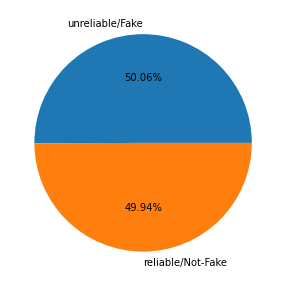

In [1578]:
#plotting the pie plot for class label column distribution on train dataset
plt.figure(figsize=(10,5))
plt.pie(df_train["label"].value_counts(),labels=["unreliable/Fake","reliable/Not-Fake"],autopct=lambda p:f'{p:.2f}%')
plt.show()

> # Observation:-
In Train dataset we have 50.06% datapoint belong to Fake news articals and 49.94% datapoint belongs to not-fake Articals

In [1579]:
# checking of null/NAN datapoints in train dataset
df_train.isnull().sum()

id           0
title      558
author    1957
text        39
label        0
dtype: int64

In [1580]:
#printing column wise Percentage of missing values on train dataset
print(pd.DataFrame(round((df_train.isnull().sum()/df_train.shape[0])*100,2),columns=['Column wise Percentage of missing values on train dataset']))

        Column wise Percentage of missing values on train dataset
id                                                   0.00        
title                                                2.68        
author                                               9.41        
text                                                 0.19        
label                                                0.00        


> # Observation
1. from above we can that in ID columns we have zero null/NAN values
2. In Title column we have 558 rows with NULL/NAN Values
3. In Author column we have 1957 rows with NULL/NAN Values
4. In text column we have 39 rows with NULL/NAN values
5. In label column we have zero NULL/NAN values

In [1581]:
# dropping all the NAN rows from train dataset
df_train.dropna(inplace=True)
df_train.reset_index(drop=True,inplace=True)  

In [1582]:
# After droping all the NAN rows from the data again cheking if we have removed all the NULL/NAN rows from train dataset
df_train.isnull().sum()

id        0
title     0
author    0
text      0
label     0
dtype: int64

In [1583]:
# Checking for duplicate rows in train dataset
df_train.duplicated().sum()

0

In [1584]:
# train dataset final shape
df_train.shape

(18285, 5)

> # Observation:-
 1. After removing NAN rows from train dataset we have lost 2515 rows
 2. Also now in our train dataset we dont have any duplicate row or rows with NAN values
 3. Now in train dataset we have 18285 rows

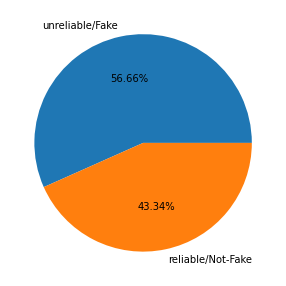

In [1585]:
#After dropping the NAN rows from data seet plotting the pie plot for class label column to see the both class counts
plt.figure(figsize=(10,5))
plt.pie(df_train["label"].value_counts(),labels=["unreliable/Fake","reliable/Not-Fake"],autopct=lambda p:f'{p:.2f}%')
plt.show()

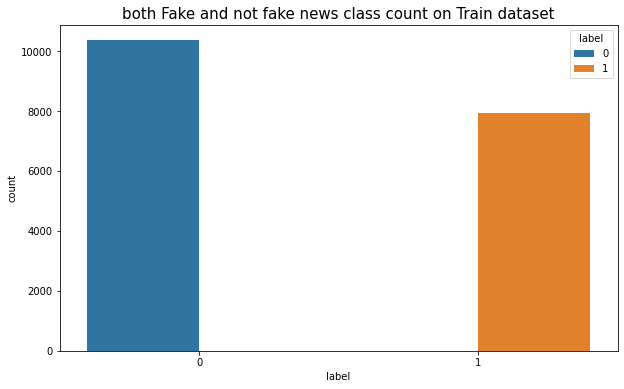

In [1586]:
plt.figure(figsize=(10,6))
sns.countplot(x ='label', hue = "label", data = df_train)
plt.title('both Fake and not fake news class count on Train dataset', fontsize=15)
plt.show()

> # Observation:
From above pie plot we see that after removeing the NAN rows from dataset now we have 56.6% rows as Fake arctical datapoints and 43.34% rows as Not-Fake artical and stll aur data is almost balanced 

> # Test data Analysis

In [1587]:
df_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5200 entries, 0 to 5199
Data columns (total 4 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   id      5200 non-null   int64 
 1   title   5078 non-null   object
 2   author  4697 non-null   object
 3   text    5193 non-null   object
dtypes: int64(1), object(3)
memory usage: 162.6+ KB


> # Observation:
Test dataset contain 5200 rows and 5 columns
file size is 162.6+ KB

In [1588]:
# checking of null/NAN datapoints in test dataset
df_test.isnull().sum()

id          0
title     122
author    503
text        7
dtype: int64

In [1589]:
#printing column wise Percentage of missing values on train dataset
print(pd.DataFrame(round((df_test.isnull().sum()/df_test.shape[0])*100,2),columns=['Column wise Percentage of missing values on train dataset']))

        Column wise Percentage of missing values on train dataset
id                                                   0.00        
title                                                2.35        
author                                               9.67        
text                                                 0.13        


In [1590]:
# filling for NAN values using ffil method
df_test.fillna(method="ffill",inplace=True)

In [1591]:
# checking of null/NAN datapoints in test dataset
df_test.isnull().sum()

id        0
title     0
author    0
text      0
dtype: int64

In [1592]:
# Checking for duplicate rows in train dataset
df_test.duplicated().sum()

0

In [1593]:
# test dataset final shape 
df_test.shape

(5200, 4)

> # Observation:-
1. In testdata set we have removed the rows with NULL/NAN values
2. In test dataset we dont have any duplicate rows
3. After removeing the rows with NAN values we lost 625 rows from test dataset and now we are having 4575 rows

> # Now Creating some features out of title text and author colums in train and test dataset

> # Creating below features on both train and test dataseet
1. Number of characters in title
2. Number of characters in text

In [1594]:
%%time
df_train['num_characters_title'] = df_train['title'].apply(len)
df_train['num_characters_text'] = df_train['text'].apply(len)

Wall time: 16 ms


In [1595]:
%%time
df_test['num_characters_title'] = df_test['title'].apply(len)
df_test['num_characters_text'] = df_test['text'].apply(len)

Wall time: 8 ms


3. Number of words in title
4. Number of words in text

In [1596]:
%%time
df_train['num_word_title'] = df_train['title'].apply(lambda x:len(nltk.word_tokenize(x)))
df_train['num_word_text'] = df_train['text'].apply(lambda x:len(nltk.word_tokenize(x)))

Wall time: 1min 32s


In [1597]:
%%time
df_test['num_word_title'] = df_test['title'].apply(lambda x:len(nltk.word_tokenize(x)))
df_test['num_word_text'] = df_test['text'].apply(lambda x:len(nltk.word_tokenize(x)))

Wall time: 30.1 s


5. Number of Sentences in title
6. Number of Sentences in text

In [1598]:
%%time
df_train['num_sentences_title'] = df_train['title'].apply(lambda x:len(nltk.sent_tokenize(x)))
df_train['num_sentences_text'] = df_train['text'].apply(lambda x:len(nltk.sent_tokenize(x)))

Wall time: 17.9 s


In [1599]:
%%time
df_test['num_sentences_title'] = df_test['title'].apply(lambda x:len(nltk.sent_tokenize(x)))
df_test['num_sentences_text'] = df_test['text'].apply(lambda x:len(nltk.sent_tokenize(x)))

Wall time: 4.97 s


In [1600]:
# final Train dataset
df_train.head(2)

,id,title,author,text,label,num_characters_title,num_characters_text,num_word_title,num_word_text,num_sentences_title,num_sentences_text
0,0,House Dem Aide: We Didn’t Even See Comey’s Let...,Darrell Lucus,House Dem Aide: We Didn’t Even See Comey’s Let...,1,81,4930,19,943,1,37
1,1,"FLYNN: Hillary Clinton, Big Woman on Campus - ...",Daniel J. Flynn,Ever get the feeling your life circles the rou...,0,55,4160,11,822,1,29


In [1601]:
#test dataset
df_test.head(2)

,id,title,author,text,num_characters_title,num_characters_text,num_word_title,num_word_text,num_sentences_title,num_sentences_text
0,20800,"Specter of Trump Loosens Tongues, if Not Purse...",David Streitfeld,"PALO ALTO, Calif. — After years of scorning...",94,8015,19,1588,1,76
1,20801,Russian warships ready to strike terrorists ne...,David Streitfeld,Russian warships ready to strike terrorists ne...,55,1559,8,277,1,10


> # Univariate Analysis

> # PDF plot

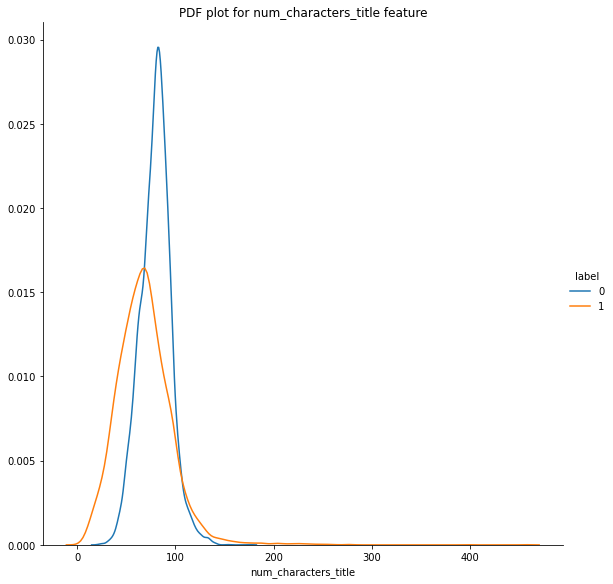

In [1602]:
#PDF plot for num_characters_title feature
sns.FacetGrid(df_train,hue="label" ,height=8).map(sns.distplot,"num_characters_title",hist=False).add_legend();
plt.title("PDF plot for num_characters_title feature")
plt.show()

> # Observations:-
1.  if Number of character in title are more than 200 or less than !10 char then it fake news
2. if  Number of character in title is between ~10 to ~180 char then its not fake news
3. This feature can be usefull on seperating both classess

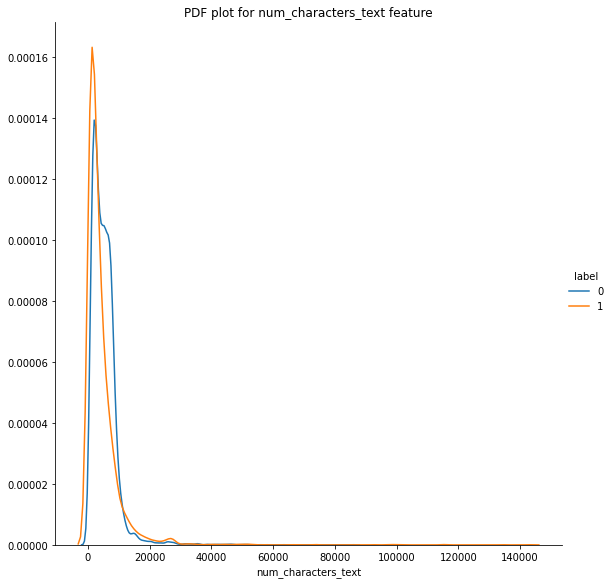

In [1603]:
#PDF plot for num_characters_title feature
sns.FacetGrid(df_train,hue="label" ,height=8).map(sns.distplot,"num_characters_text",hist=False).add_legend();
plt.title("PDF plot for num_characters_text feature")
plt.show()

> # Observations:-
1.  Both pdfs are overlapping and we can not make any observation from above pdfs

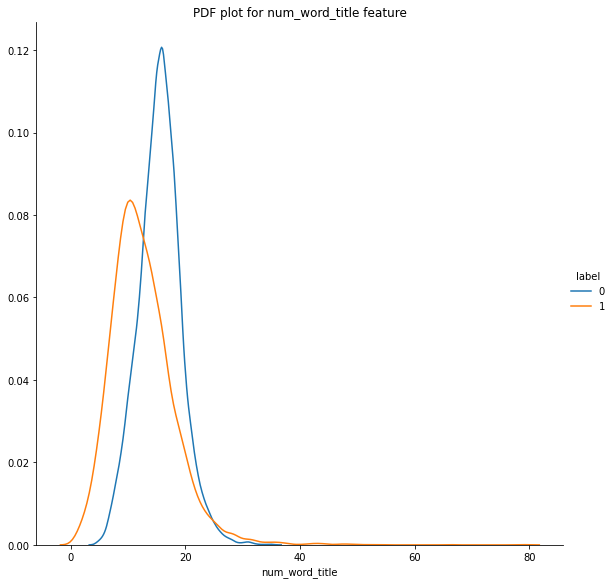

In [1604]:
#PDF plot for num_word_title feature
sns.FacetGrid(df_train,hue="label" ,height=8).map(sns.distplot,"num_word_title",hist=False).add_legend();
plt.title("PDF plot for num_word_title feature")
plt.show()

> # Observations:-
1. if number of words in ttile between ~10 to 20 then its a not fake news
2. if number of words in title are less than ~10 then it can be fake news articles
3. Also we can see that this feature is able to seperate both classes to some extend
4. This feature can be usefull on seperating both classess

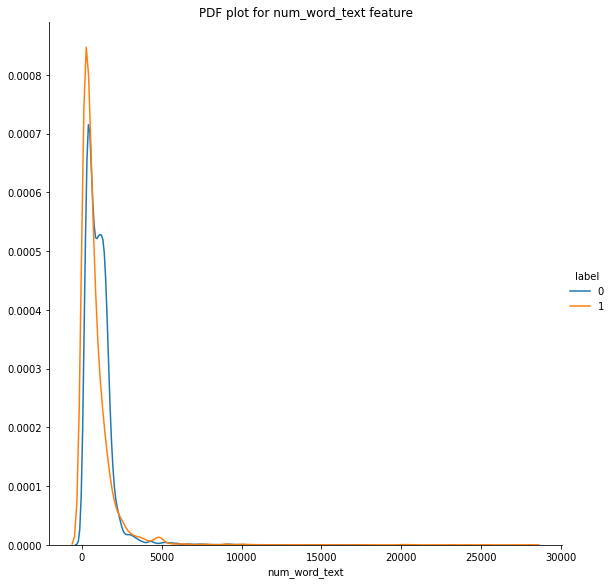

In [1605]:
#PDF plot for num_word_author feature
sns.FacetGrid(df_train,hue="label" ,height=8).map(sns.distplot,"num_word_text",hist=False).add_legend();
plt.title("PDF plot for num_word_text feature")
plt.show()

> # Observations:-
1.  Above PDF plot are almost overlapping and  we can not make any observation from above pdfs

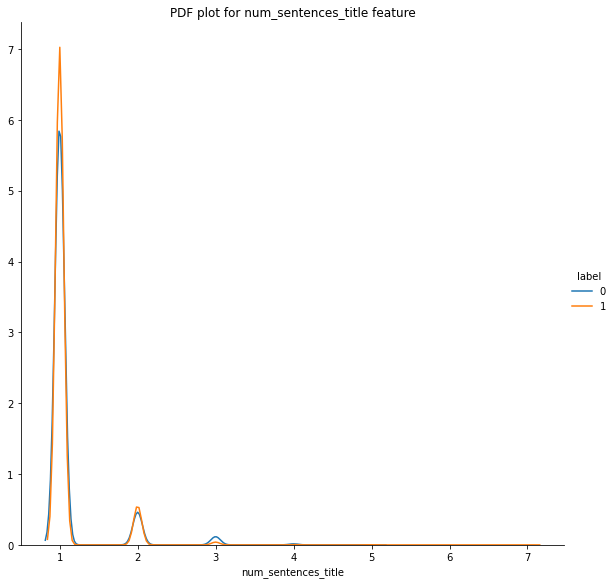

In [1606]:
#PDF plot for num_sentences_title feature
sns.FacetGrid(df_train,hue="label" ,height=8).map(sns.distplot,"num_sentences_title",hist=False).add_legend();
plt.title("PDF plot for num_sentences_title feature")
plt.show()

> # Observations:-
1.  Above PDF plot are almost overlapping and we can not make any observation from above pdfs.

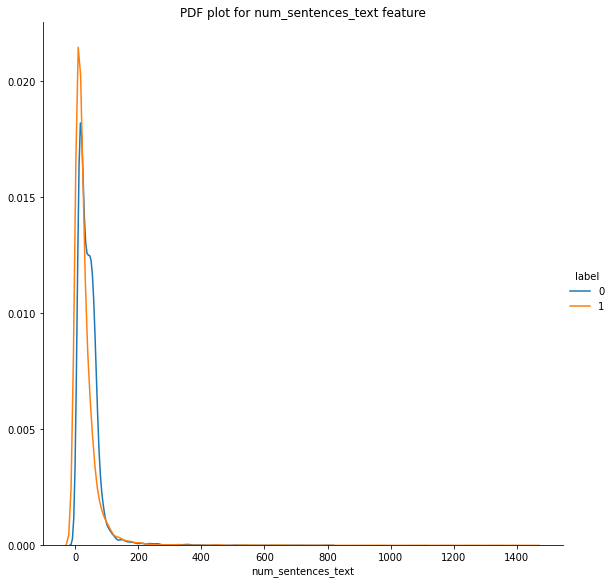

In [1607]:
#PDF plot for num_sentences_text feature
sns.FacetGrid(df_train,hue="label" ,height=8).map(sns.distplot,"num_sentences_text",hist=False).add_legend();
plt.title("PDF plot for num_sentences_text feature")
plt.show()

> # Observations:-
1.  Above PDF plot are almost overlapping and  we can not make any observation from above pdfs.

> # CDF plot of above  features

In [1608]:
#spliting both classess
Fake=df_train.loc[df_train["label"]==1]
Not_Fake=df_train.loc[df_train["label"]==0]

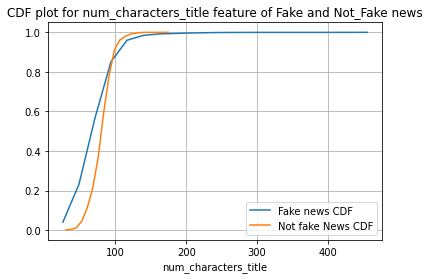

In [1609]:
#Fake news CDF plot
count ,bin_edges=np.histogram(Fake["num_characters_title"],bins=20,density=True)
pdf=count/(sum(count))
cdf=np.cumsum(pdf)
plt.plot(bin_edges[1:],cdf,label="Fake CDF")

#Not-Fake news CDF plot
count ,bin_edges=np.histogram(Not_Fake["num_characters_title"],bins=20,density=True)
pdf=count/(sum(count))
cdf=np.cumsum(pdf)
plt.plot(bin_edges[1:],cdf,label="Not fake CDF")

plt.xlabel("num_characters_title")
plt.title("CDF plot for num_characters_title feature of Fake and Not_Fake news")
plt.grid()
plt.legend(['Fake news CDF', 'Not fake News CDF'],loc='lower right');
plt.show()

> # Observations:-
1. Almost ~85% fake news title constain less than or equal to 100 charaters in fake news title.
2. Almost ~60% not fake news title constain less than 100 characters .

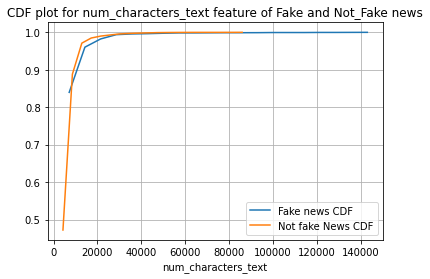

In [1610]:
#Fake news CDF plot
count ,bin_edges=np.histogram(Fake["num_characters_text"],bins=20,density=True)
pdf=count/(sum(count))
cdf=np.cumsum(pdf)
plt.plot(bin_edges[1:],cdf,label="Fake CDF")

#Not-Fake news CDF plot
count ,bin_edges=np.histogram(Not_Fake["num_characters_text"],bins=20,density=True)
pdf=count/(sum(count))
cdf=np.cumsum(pdf)
plt.plot(bin_edges[1:],cdf,label="Not fake CDF")

plt.xlabel("num_characters_text")
plt.title("CDF plot for num_characters_text feature of Fake and Not_Fake news")
plt.grid()
plt.legend(['Fake news CDF', 'Not fake News CDF'],loc='lower right');
plt.show()

> # Observations:-
1. Almost 98% fake news text contain less than or equal to 20000 characters.
2. Almost ~90% not fake news text contain less than  20000 characters.

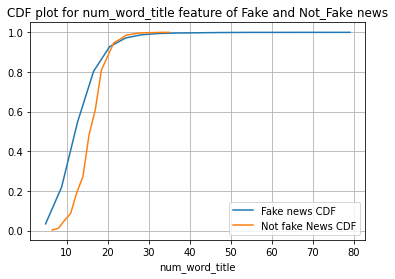

In [1611]:
#Fake news CDF plot
count ,bin_edges=np.histogram(Fake["num_word_title"],bins=20,density=True)
pdf=count/(sum(count))
cdf=np.cumsum(pdf)
plt.plot(bin_edges[1:],cdf,label="Fake CDF")

#Not-Fake news CDF plot
count ,bin_edges=np.histogram(Not_Fake["num_word_title"],bins=20,density=True)
pdf=count/(sum(count))
cdf=np.cumsum(pdf)
plt.plot(bin_edges[1:],cdf,label="Not fake CDF")

plt.xlabel("num_word_title")
plt.title("CDF plot for num_word_title feature of Fake and Not_Fake news")
plt.grid()
plt.legend(['Fake news CDF', 'Not fake News CDF'],loc='lower right');
plt.show()

> # Observations:-
1. Almost 80% fake news title contain less than 20 words .
2. Almost ~85% not fake news title contain less than or equal to 20.

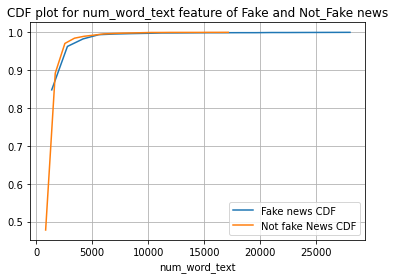

In [1612]:
#Fake news CDF plot
count ,bin_edges=np.histogram(Fake["num_word_text"],bins=20,density=True)
pdf=count/(sum(count))
cdf=np.cumsum(pdf)
plt.plot(bin_edges[1:],cdf,label="Fake CDF")

#Not-Fake news CDF plot
count ,bin_edges=np.histogram(Not_Fake["num_word_text"],bins=20,density=True)
pdf=count/(sum(count))
cdf=np.cumsum(pdf)
plt.plot(bin_edges[1:],cdf,label="Not fake CDF")

plt.xlabel("num_word_text")
plt.title("CDF plot for num_word_text feature of Fake and Not_Fake news")
plt.grid()
plt.legend(['Fake news CDF', 'Not fake News CDF'],loc='lower right');
plt.show()

> # Observations:-
1. Almost ~90% fake news text contain less than 5000 words.
2. Almost ~80% not fake news text contain less than 5000 words.

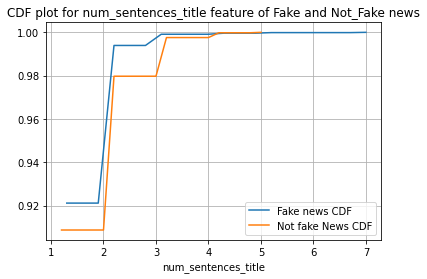

In [1613]:
#Fake news CDF plot
count ,bin_edges=np.histogram(Fake["num_sentences_title"],bins=20,density=True)
pdf=count/(sum(count))
cdf=np.cumsum(pdf)
plt.plot(bin_edges[1:],cdf,label="Fake CDF")

#Not-Fake news CDF plot
count ,bin_edges=np.histogram(Not_Fake["num_sentences_title"],bins=20,density=True)
pdf=count/(sum(count))
cdf=np.cumsum(pdf)
plt.plot(bin_edges[1:],cdf,label="Not fake CDF")

plt.xlabel("num_sentences_title")
plt.title("CDF plot for num_sentences_title feature of Fake and Not_Fake news")
plt.grid()
plt.legend(['Fake news CDF', 'Not fake News CDF'],loc='lower right');
plt.show()

> # Observations:-
1. Almost ~99% fake news title contain less than 3 sentences .
2. Almost ~98% not fake news title contain less than or equal to 3 sentences 

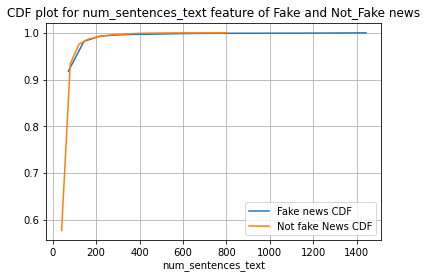

In [1614]:
#Fake news CDF plot
count ,bin_edges=np.histogram(Fake["num_sentences_text"],bins=20,density=True)
pdf=count/(sum(count))
cdf=np.cumsum(pdf)
plt.plot(bin_edges[1:],cdf,label="Fake CDF")

#Not-Fake news CDF plot
count ,bin_edges=np.histogram(Not_Fake["num_sentences_text"],bins=20,density=True)
pdf=count/(sum(count))
cdf=np.cumsum(pdf)
plt.plot(bin_edges[1:],cdf,label="Not fake CDF")

plt.xlabel("num_sentences_text")
plt.title("CDF plot for num_sentences_text feature of Fake and Not_Fake news")
plt.grid()
plt.legend(['Fake news CDF', 'Not fake News CDF'],loc='lower right');
plt.show()

> #  Observations:-
1. Almost ~98% fake news text contain less than 200 sentences.
2. Almost ~80% not fake news text contain less than 200 sentences

> # Creating Advanced text features from title and text column of train dataset

Create count unique words function to count unique words in text data

In [1615]:
def count_unique_words(text):
    '''this function will count total number of unique words in text and title column'''
    word_tokens = nltk.word_tokenize(text)
    unique_words=[]
    for i in range(len(word_tokens)):
        if word_tokens[i] not in unique_words:
            unique_words.append(word_tokens[i])    
    return len(unique_words)

> # 1. Count of unique words on text and title column

In [1616]:
%%time
df_train['Count_unique_words_title'] = df_train['title'].apply(lambda x:count_unique_words(x))
df_train['Count_unique_words_text'] = df_train['text'].apply(lambda x:count_unique_words(x))

Wall time: 2min 3s


In [1617]:
%%time
df_test['Count_unique_words_title'] = df_test['title'].apply(lambda x:count_unique_words(x))
df_test['Count_unique_words_text'] = df_test['text'].apply(lambda x:count_unique_words(x))

Wall time: 33.9 s


Create count stopwords function to count stopwords in text data

In [1618]:
def count_stopwords(text):
    '''this function will count total number of stop words in text and title column'''

    stop_words = set(stopwords.words('english'))  
    word_tokens = nltk.word_tokenize(text)
    c_stopwords = [w for w in word_tokens if w in stop_words]
    
    return len(c_stopwords)

> # 2. Count of stopwords on text and title column

In [1619]:
%%time
df_train['Count_Stop_words_title'] = df_train['title'].apply(lambda x:count_stopwords(x))
df_train['Count_Stop_words_text'] = df_train['text'].apply(lambda x:count_stopwords(x))

Wall time: 1min 41s


In [1620]:
%%time
df_test['Count_Stop_words_title'] = df_test['title'].apply(lambda x:count_stopwords(x))
df_test['Count_Stop_words_text'] = df_test['text'].apply(lambda x:count_stopwords(x))

Wall time: 27.1 s


> # 3. Calculating average word length

In [1621]:
%%time
#This can be calculated by dividing the counts of characters by counts of words.
df_train['Avg_word_length_title'] = df_train['num_characters_title']/df_train["num_word_title"]
df_train['Avg_word_length_text'] = df_train['num_characters_text']/df_train["num_word_text"]

Wall time: 22.4 ms


In [1622]:
%%time
#This can be calculated by dividing the counts of characters by counts of words.
df_test['Avg_word_length_title'] = df_test['num_characters_title']/df_test["num_word_title"]
df_test['Avg_word_length_text'] = df_test['num_characters_text']/df_test["num_word_text"]

Wall time: 0 ns


> # 4. Calculating average sentence length

In [1623]:
%%time
#This can be calculated by dividing the counts of words by the counts of sentences.
df_train['Avg_sentence_length_title'] = df_train['num_word_title']/df_train["num_sentences_title"]
df_train['Avg_sentence_length_text'] = df_train['num_word_text']/df_train["num_sentences_text"]

Wall time: 0 ns


In [1624]:
%%time
#This can be calculated by dividing the counts of words by the counts of sentences.
df_test['Avg_sentence_length_title'] = df_test['num_word_title']/df_test["num_sentences_title"]
df_test['Avg_sentence_length_text'] = df_test['num_word_text']/df_test["num_sentences_text"]

Wall time: 7.99 ms


> # 5.  Stopwords count vs words counts Ratio

In [1625]:
%%time
#This feature is also the ratio of counts of stopwords to the total number of words.
df_train['Stopword_count_ratio_title'] = df_train['Count_Stop_words_title']/df_train["num_word_title"]
df_train['Stopword_count_ratio_text'] = df_train['Count_Stop_words_text']/df_train["num_word_text"]


Wall time: 0 ns


In [1626]:
%%time
#This feature is also the ratio of counts of stopwords to the total number of words.
df_test['Stopword_count_ratio_title'] = df_test['Count_Stop_words_title']/df_test["num_word_title"]
df_test['Stopword_count_ratio_text'] = df_test['Count_Stop_words_text']/df_test["num_word_text"]

Wall time: 0 ns


> # 6. unique words vs word count Ratio

In [1627]:
%%time
#This feature is basically the ratio of unique words to a total number of words.
df_train['Unique_words_count_ratio_title'] = df_train['Count_unique_words_title']/df_train["num_word_title"]
df_train['Unique_words_count_ratio_text'] = df_train['Count_unique_words_text']/df_train["num_word_text"]

Wall time: 7.96 ms


In [1628]:
%%time
#This feature is basically the ratio of unique words to a total number of words.
df_test['Unique_words_count_ratio_title'] = df_test['Count_unique_words_title']/df_test["num_word_title"]
df_test['Unique_words_count_ratio_text'] = df_test['Count_unique_words_text']/df_test["num_word_text"]

Wall time: 0 ns


> # PDF plots for above advanced features

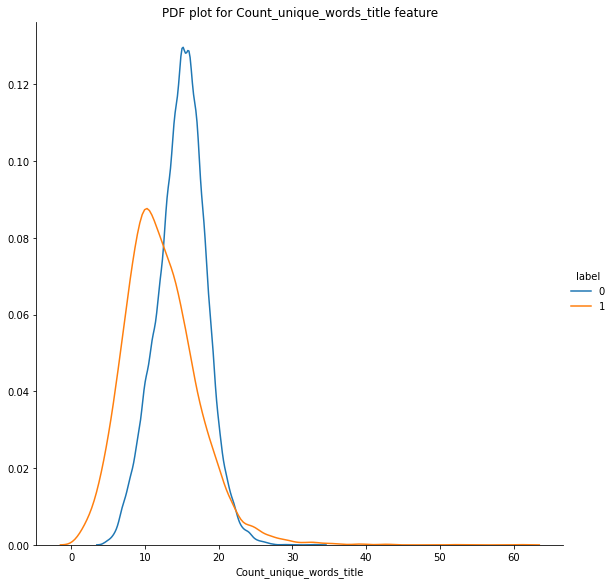

In [1630]:
#PDF plot for Count_unique_words_title feature
sns.FacetGrid(df_train,hue="label" ,height=8).map(sns.distplot,"Count_unique_words_title",hist=False).add_legend();
plt.title("PDF plot for Count_unique_words_title feature")
plt.show()

#  Observations:-
1. for fake news pdf is looks to be distributed normally
2. If unique word count is less then 10 then there are chance that news articles is fake
3. If unique word count is between 10 and 20 then its not fake news
4. This feature can be usefull on seperating both classess

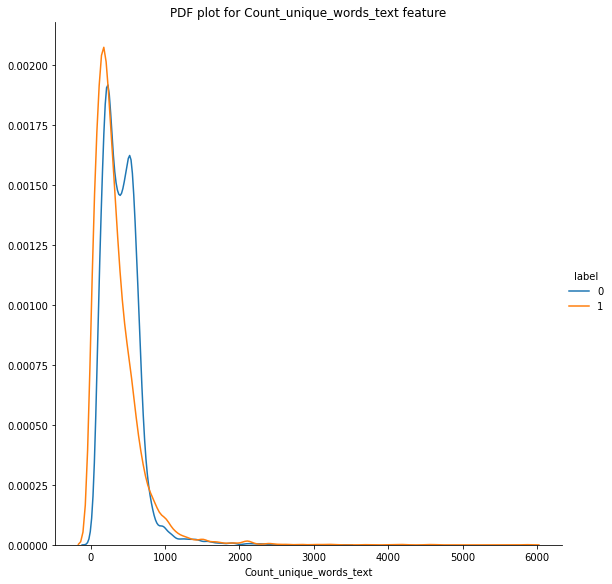

In [1631]:
#PDF plot for Count_unique_words_text feature
sns.FacetGrid(df_train,hue="label" ,height=8).map(sns.distplot,"Count_unique_words_text",hist=False).add_legend();
plt.title("PDF plot for Count_unique_words_text feature")
plt.show()

#  Observations:-
1. Both pdfs are almost overlapping but the there is slight differences in pdfs as well 

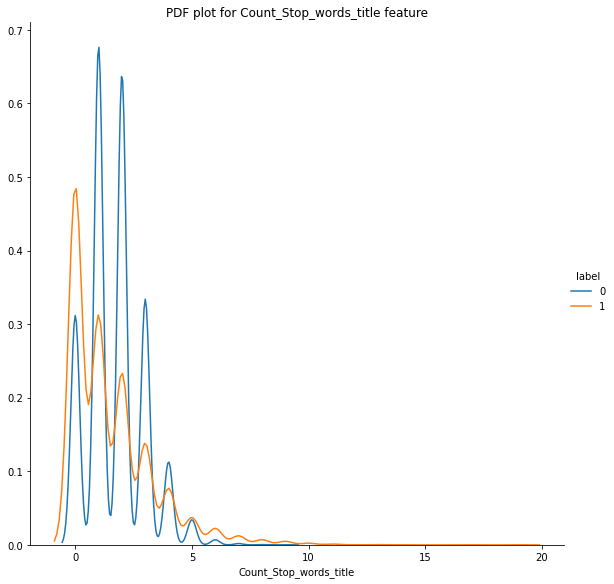

In [1632]:
#PDF plot for Count_Stop_words_title feature
sns.FacetGrid(df_train,hue="label" ,height=8).map(sns.distplot,"Count_Stop_words_title",hist=False).add_legend();
plt.title("PDF plot for Count_Stop_words_title feature")
plt.show()

> # Observations:-
1.  both pdfs are in zig zag shape 
2. if Count of stop words in title more than 5 then its fake news articles
3. if Count of stop words in title is less than 5 then its not fake news articles
4. This feature can be usefull on seperating both classess

<Figure size 720x720 with 0 Axes>

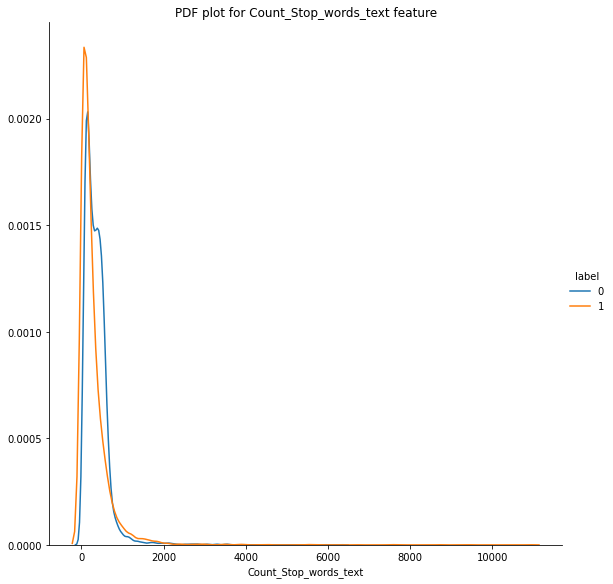

In [1633]:
#PDF plot for Count_Stop_words_text feature
plt.figure(figsize=(10,10))
sns.FacetGrid(df_train,hue="label" ,height=8).map(sns.distplot,"Count_Stop_words_text",hist=False).add_legend();
plt.title("PDF plot for Count_Stop_words_text feature")
plt.show()

> # Observations:-
1.  Both PDFs are overlapping and we can not make any observation from above pdf as both pdf are very close to each other

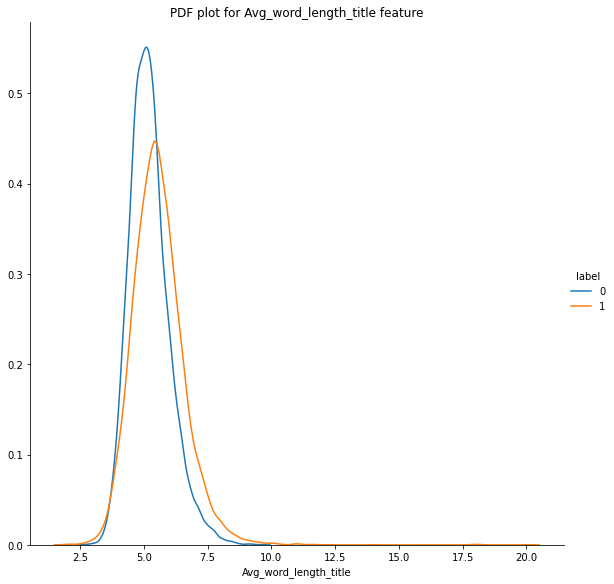

In [1634]:
#PDF plot for Avg_word_length_title feature
sns.FacetGrid(df_train,hue="label" ,height=8).map(sns.distplot,"Avg_word_length_title",hist=False).add_legend();
plt.title("PDF plot for Avg_word_length_title feature")
plt.show()

> # Observations:-
1.  Both PDFs are almost overlapping 
2. if avg_word_length on title is more than 10 then its fake news articles
3. if avg_word_length on title is less than 7.5 then its not fake news articles
4. This feature can be usefull on seperating both classess

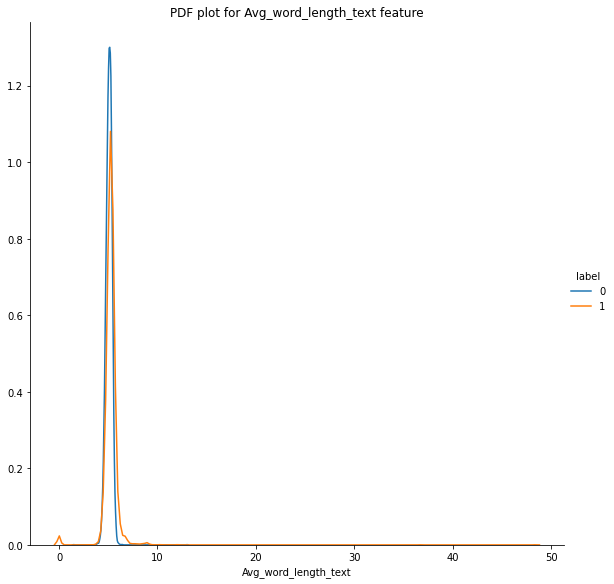

In [1635]:
#PDF plot for Avg_word_length_text feature
sns.FacetGrid(df_train,hue="label" ,height=8).map(sns.distplot,"Avg_word_length_text",hist=False).add_legend();
plt.title("PDF plot for Avg_word_length_text feature")
plt.show()

> # Observations:-
1.  Both PDFs are overlapping and we can not make any observation from above pdfs.

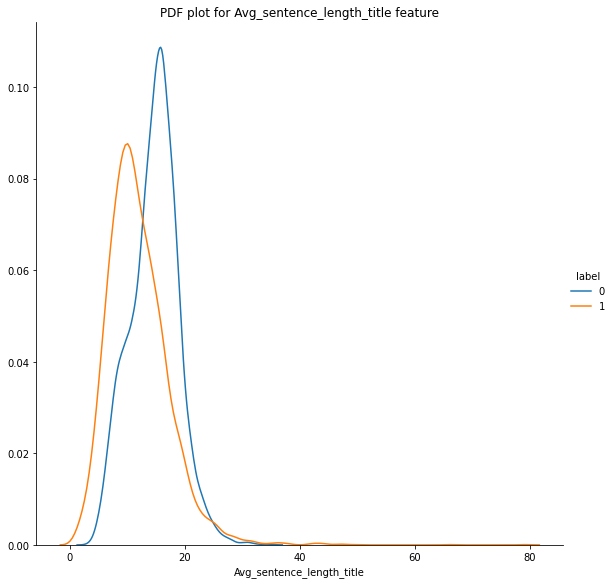

In [1636]:
#PDF plot for Avg_sentence_length_title feature
sns.FacetGrid(df_train,hue="label" ,height=8).map(sns.distplot,"Avg_sentence_length_title",hist=False).add_legend();
plt.title("PDF plot for Avg_sentence_length_title feature")
plt.show()

> # Observations:-
1.  Here also both pdfs are overlapping 
2. if avg senetence length on title is between ~5 to 20 then is not fake news
3. if avg senetence length on title is less than ~5 then is fake news
4. This feature can be usefull on seperating both classess

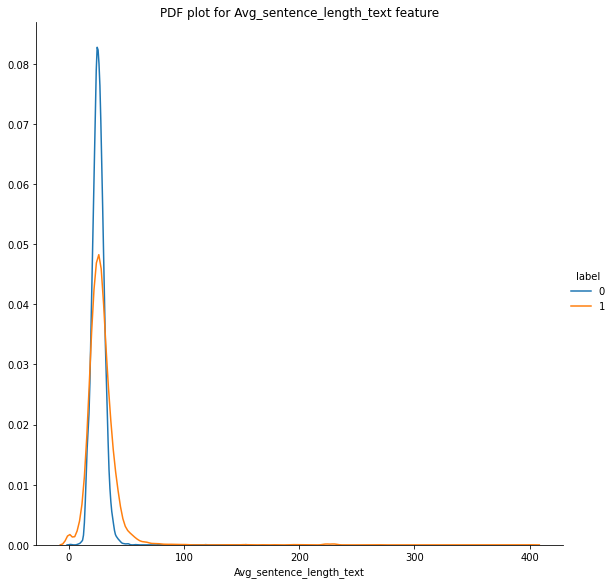

In [1637]:
#PDF plot for Avg_sentence_length_text feature
sns.FacetGrid(df_train,hue="label" ,height=8).map(sns.distplot,"Avg_sentence_length_text",hist=False).add_legend();
plt.title("PDF plot for Avg_sentence_length_text feature")
plt.show()

> # Observations:-¶
1. Here also both pdfs are overlapping
2. If avg sentence length on text is more than 100 then its fake news articles

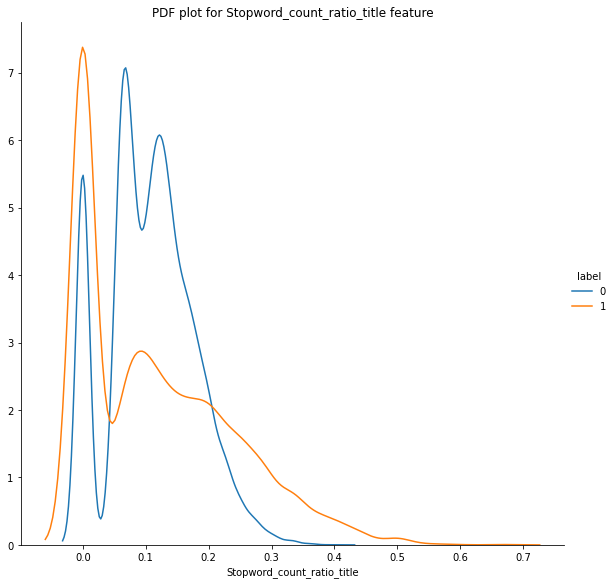

In [1638]:
#PDF plot for Stopword_count_ratio_title feature
sns.FacetGrid(df_train,hue="label" ,height=8).map(sns.distplot,"Stopword_count_ratio_title",hist=False).add_legend();
plt.title("PDF plot for Stopword_count_ratio_title feature")
plt.show()

> # Observations:-
1. if Stopwords count ratio in title more than 0.4 then its fake news
2. if Stopwords count ratio in title less than 0.4 then its not fake news
3. This feature can be usefull on seperating both classess

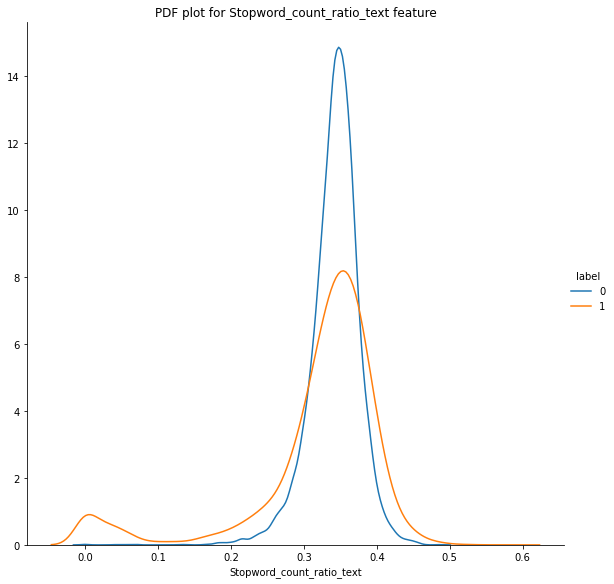

In [1639]:
#PDF plot for Stopword_count_ratio_text feature
sns.FacetGrid(df_train,hue="label" ,height=8).map(sns.distplot,"Stopword_count_ratio_text",hist=False).add_legend();
plt.title("PDF plot for Stopword_count_ratio_text feature")
plt.show()

> # Observations:-
1. Here also both pdfs are overlapping 
2. PDF of fake news is left skewed 
3. if Stop word count raito on artical text is less 0.2 then its a fake news articles 
4. if Stop word count raito on artical text is between 0.2 to 0.4 then its a not fake news articles 
5. This feature can be usefull on seperating both classess

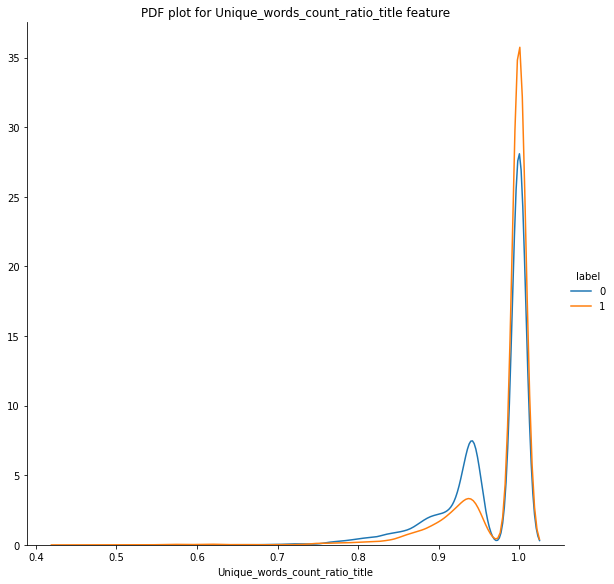

In [1640]:
#PDF plot for Unique_words_count_ratio_title feature
sns.FacetGrid(df_train,hue="label" ,height=8).map(sns.distplot,"Unique_words_count_ratio_title",hist=False).add_legend();
plt.title("PDF plot for Unique_words_count_ratio_title feature")
plt.show()

> # Observations:-
1. Both pdfs are overlapping and we can make any observation from above pdfs

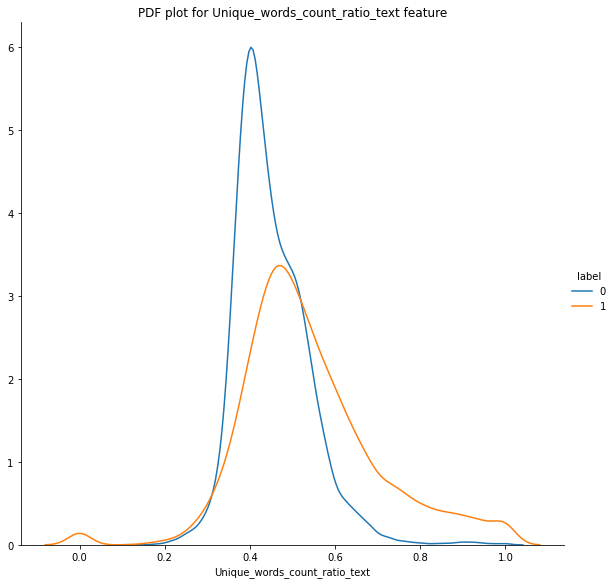

In [1641]:
#PDF plot for Unique_words_count_ratio_title feature
sns.FacetGrid(df_train,hue="label" ,height=8).map(sns.distplot,"Unique_words_count_ratio_text",hist=False).add_legend();
plt.title("PDF plot for Unique_words_count_ratio_text feature")
plt.show()

> # Observations:-
1. both plots are overlapping 
2. if unique words count ratio on artical text is more then 1.0 then its a fake news articles
3. if unique words count ratio on artical text is betwwee 0.2 to 0.8 then its a not fake news articles
4. This feature can be usefull on seperating both classess

> # CDF plot for above advanced features:-

In [1642]:
Fake_adv=df_train.loc[df_train["label"]==1]
Not_Fake_adv=df_train.loc[df_train["label"]==0]

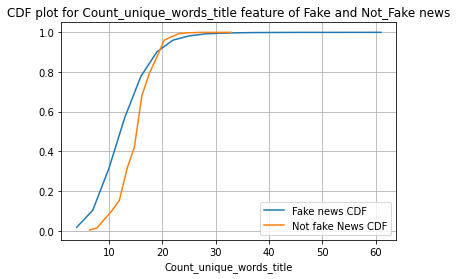

In [1643]:
#Fake news CDF plot
count ,bin_edges=np.histogram(Fake_adv["Count_unique_words_title"],bins=20,density=True)
pdf=count/(sum(count))
cdf=np.cumsum(pdf)
plt.plot(bin_edges[1:],cdf,label="Fake CDF")

#Not-Fake news CDF plot
count ,bin_edges=np.histogram(Not_Fake_adv["Count_unique_words_title"],bins=20,density=True)
pdf=count/(sum(count))
cdf=np.cumsum(pdf)
plt.plot(bin_edges[1:],cdf,label="Not fake CDF")

plt.xlabel("Count_unique_words_title")
plt.title("CDF plot for Count_unique_words_title feature of Fake and Not_Fake news")
plt.grid()
plt.legend(['Fake news CDF', 'Not fake News CDF'],loc='lower right');
plt.show()

> # Observations:-
1. Almost 80% fake news artical title have less than 20 unique words
2. Almost ~60% not fake news artical title have less than 20 unique words.

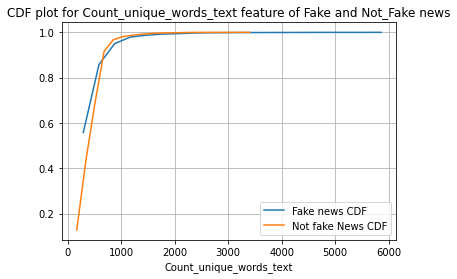

In [1644]:
#Fake news CDF plot
count ,bin_edges=np.histogram(Fake_adv["Count_unique_words_text"],bins=20,density=True)
pdf=count/(sum(count))
cdf=np.cumsum(pdf)
plt.plot(bin_edges[1:],cdf,label="Fake CDF")

#Not-Fake news CDF plot
count ,bin_edges=np.histogram(Not_Fake_adv["Count_unique_words_text"],bins=20,density=True)
pdf=count/(sum(count))
cdf=np.cumsum(pdf)
plt.plot(bin_edges[1:],cdf,label="Not fake CDF")

plt.xlabel("Count_unique_words_text")
plt.title("CDF plot for Count_unique_words_text feature of Fake and Not_Fake news")
plt.grid()
plt.legend(['Fake news CDF', 'Not fake News CDF'],loc='lower right');
plt.show()

> # Observations:-
1. Almost ~90% fake news artical text have less than or equal to 1000 unique words.
2. Almost ~80% not fake news artical title have less than 1000 unique words.

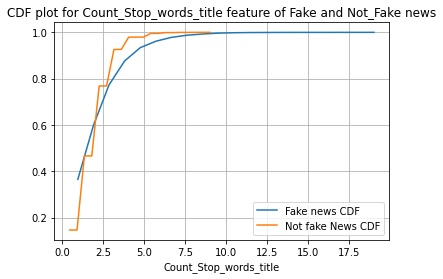

In [1645]:
#Fake news CDF plot
count ,bin_edges=np.histogram(Fake_adv["Count_Stop_words_title"],bins=20,density=True)
pdf=count/(sum(count))
cdf=np.cumsum(pdf)
plt.plot(bin_edges[1:],cdf,label="Fake CDF")

#Not-Fake news CDF plot
count ,bin_edges=np.histogram(Not_Fake_adv["Count_Stop_words_title"],bins=20,density=True)
pdf=count/(sum(count))
cdf=np.cumsum(pdf)
plt.plot(bin_edges[1:],cdf,label="Not fake CDF")

plt.xlabel("Count_Stop_words_title")
plt.title("CDF plot for Count_Stop_words_title feature of Fake and Not_Fake news")
plt.grid()
plt.legend(['Fake news CDF', 'Not fake News CDF'],loc='lower right');
plt.show()

> # Observation:-
1. Almost 80% Fake artical title have less than 5 stopwords.
2. Almost 60% not Fake artical artical title have less than 2 stopwords.

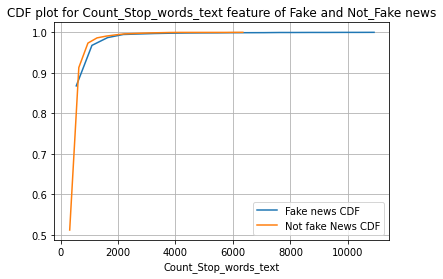

In [1646]:
#Fake news CDF plot
count ,bin_edges=np.histogram(Fake_adv["Count_Stop_words_text"],bins=20,density=True)
pdf=count/(sum(count))
cdf=np.cumsum(pdf)
plt.plot(bin_edges[1:],cdf,label="Fake CDF")

#Not-Fake news CDF plot
count ,bin_edges=np.histogram(Not_Fake_adv["Count_Stop_words_text"],bins=20,density=True)
pdf=count/(sum(count))
cdf=np.cumsum(pdf)
plt.plot(bin_edges[1:],cdf,label="Not fake CDF")

plt.xlabel("Count_Stop_words_text")
plt.title("CDF plot for Count_Stop_words_text feature of Fake and Not_Fake news")
plt.grid()
plt.legend(['Fake news CDF', 'Not fake News CDF'],loc='lower right');
plt.show()

> # Observation:-
1. Almost 98% Fake artical text will have less than 2000 stopwords. 
2. Almost 98% not Fake artical text will have less than 1000 stopwords.

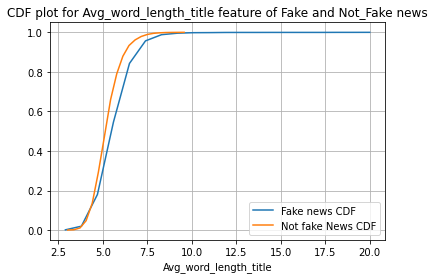

In [1647]:
#Fake news CDF plot
count ,bin_edges=np.histogram(Fake_adv["Avg_word_length_title"],bins=20,density=True)
pdf=count/(sum(count))
cdf=np.cumsum(pdf)
plt.plot(bin_edges[1:],cdf,label="Fake CDF")

#Not-Fake news CDF plot
count ,bin_edges=np.histogram(Not_Fake_adv["Avg_word_length_title"],bins=20,density=True)
pdf=count/(sum(count))
cdf=np.cumsum(pdf)
plt.plot(bin_edges[1:],cdf,label="Not fake CDF")

plt.xlabel("Avg_word_length_title")
plt.title("CDF plot for Avg_word_length_title feature of Fake and Not_Fake news")
plt.grid()
plt.legend(['Fake news CDF', 'Not fake News CDF'],loc='lower right');
plt.show()

> # Observation:-
1. Almost 80%  Fake news artical title have less than 7.5 avg word lengh
2. Almost ~45% not Fake news artical title have less than or equla to 5 avg word lengh

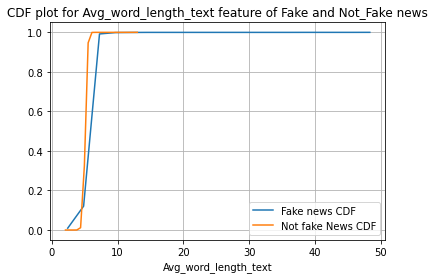

In [1648]:
#Fake news CDF plot
count ,bin_edges=np.histogram(Fake_adv["Avg_word_length_text"],bins=20,density=True)
pdf=count/(sum(count))
cdf=np.cumsum(pdf)
plt.plot(bin_edges[1:],cdf,label="Fake CDF")

#Not-Fake news CDF plot
count ,bin_edges=np.histogram(Not_Fake_adv["Avg_word_length_text"],bins=20,density=True)
pdf=count/(sum(count))
cdf=np.cumsum(pdf)
plt.plot(bin_edges[1:],cdf,label="Not fake CDF")

plt.xlabel("Avg_word_length_text")
plt.title("CDF plot for Avg_word_length_text feature of Fake and Not_Fake news")
plt.grid()
plt.legend(['Fake news CDF', 'Not fake News CDF'],loc='lower right');
plt.show()

> # Observation:-
1. Almost 80%  Fake news artical text  have less than 10  avg word lengh
2. Almost 60% not  Fake news artical text  have less than 10  avg word length

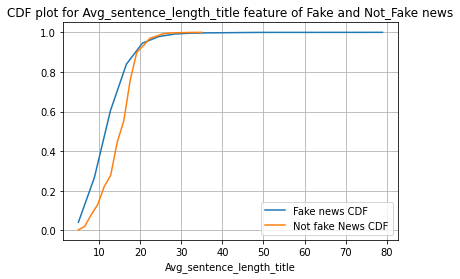

In [1649]:
#Fake news CDF plot
count ,bin_edges=np.histogram(Fake_adv["Avg_sentence_length_title"],bins=20,density=True)
pdf=count/(sum(count))
cdf=np.cumsum(pdf)
plt.plot(bin_edges[1:],cdf,label="Fake CDF")

#Not-Fake news CDF plot
count ,bin_edges=np.histogram(Not_Fake_adv["Avg_sentence_length_title"],bins=20,density=True)
pdf=count/(sum(count))
cdf=np.cumsum(pdf)
plt.plot(bin_edges[1:],cdf,label="Not fake CDF")

plt.xlabel("Avg_sentence_length_title")
plt.title("CDF plot for Avg_sentence_length_title feature of Fake and Not_Fake news")
plt.grid()
plt.legend(['Fake news CDF', 'Not fake News CDF'],loc='lower right');
plt.show()

> # Observation:-
1. Almost 80% Fake news artical title will have less than 20  avg sentence length.
2. Almost 60% not Fake news artical title have less than 20  avg sentence length

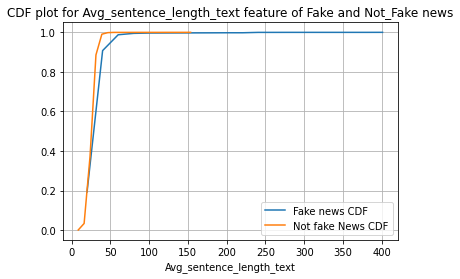

In [1650]:
#Fake news CDF plot
count ,bin_edges=np.histogram(Fake_adv["Avg_sentence_length_text"],bins=20,density=True)
pdf=count/(sum(count))
cdf=np.cumsum(pdf)
plt.plot(bin_edges[1:],cdf,label="Fake CDF")

#Not-Fake news CDF plot
count ,bin_edges=np.histogram(Not_Fake_adv["Avg_sentence_length_text"],bins=20,density=True)
pdf=count/(sum(count))
cdf=np.cumsum(pdf)
plt.plot(bin_edges[1:],cdf,label="Not fake CDF")

plt.xlabel("Avg_sentence_length_text")
plt.title("CDF plot for Avg_sentence_length_text feature of Fake and Not_Fake news")
plt.grid()
plt.legend(['Fake news CDF', 'Not fake News CDF'],loc='lower right');
plt.show()

> # Observation:-
1. Almost ~80% Fake news artical text have less than 50  avg sentence length
2. Almost ~80% not Fake news artical text have less than 50  avg sentence length

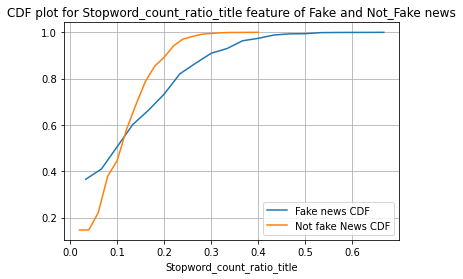

In [1651]:
#Fake news CDF plot
count ,bin_edges=np.histogram(Fake_adv["Stopword_count_ratio_title"],bins=20,density=True)
pdf=count/(sum(count))
cdf=np.cumsum(pdf)
plt.plot(bin_edges[1:],cdf,label="Fake CDF")

#Not-Fake news CDF plot
count ,bin_edges=np.histogram(Not_Fake_adv["Stopword_count_ratio_title"],bins=20,density=True)
pdf=count/(sum(count))
cdf=np.cumsum(pdf)
plt.plot(bin_edges[1:],cdf,label="Not fake CDF")

plt.xlabel("Stopword_count_ratio_title")
plt.title("CDF plot for Stopword_count_ratio_title feature of Fake and Not_Fake news")
plt.grid()
plt.legend(['Fake news CDF', 'Not fake News CDF'],loc='lower right');
plt.show()

> # Observation:-
1. Almost ~90% Fake news artical title have less than 0.3  stopwords count ratio
2. Almost ~80% not Fake news artical title have less than 0.2  stop word count ratio

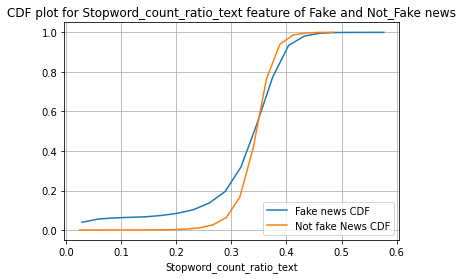

In [1652]:
#Fake news CDF plot
count ,bin_edges=np.histogram(Fake_adv["Stopword_count_ratio_text"],bins=20,density=True)
pdf=count/(sum(count))
cdf=np.cumsum(pdf)
plt.plot(bin_edges[1:],cdf,label="Fake CDF")

#Not-Fake news CDF plot
count ,bin_edges=np.histogram(Not_Fake_adv["Stopword_count_ratio_text"],bins=20,density=True)
pdf=count/(sum(count))
cdf=np.cumsum(pdf)
plt.plot(bin_edges[1:],cdf,label="Not fake CDF")

plt.xlabel("Stopword_count_ratio_text")
plt.title("CDF plot for Stopword_count_ratio_text feature of Fake and Not_Fake news")
plt.grid()
plt.legend(['Fake news CDF', 'Not fake News CDF'],loc='lower right');
plt.show()

> # Observation:-
1. Almost ~80% Fake news artical text have less than 0.4  stop word count ratio
2. Almost ~60% not Fake news artical text have less than 0.4  stopwords count ratio

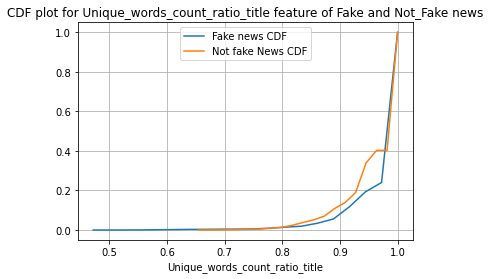

In [1653]:
#Fake news CDF plot
count ,bin_edges=np.histogram(Fake_adv["Unique_words_count_ratio_title"],bins=20,density=True)
pdf=count/(sum(count))
cdf=np.cumsum(pdf)
plt.plot(bin_edges[1:],cdf,label="Fake CDF")

#Not-Fake news CDF plot
count ,bin_edges=np.histogram(Not_Fake_adv["Unique_words_count_ratio_title"],bins=20,density=True)
pdf=count/(sum(count))
cdf=np.cumsum(pdf)
plt.plot(bin_edges[1:],cdf,label="Not fake CDF")

plt.xlabel("Unique_words_count_ratio_title")
plt.title("CDF plot for Unique_words_count_ratio_title feature of Fake and Not_Fake news")
plt.grid()
plt.legend(['Fake news CDF', 'Not fake News CDF'],loc='upper center');
plt.show()

> # Observation:-
1. Almost ~60%  Fake news artical title have less than 1 unique word count ratio
2. Almost ~60%  not Fake news artical title have less 1 unique word count ratio 

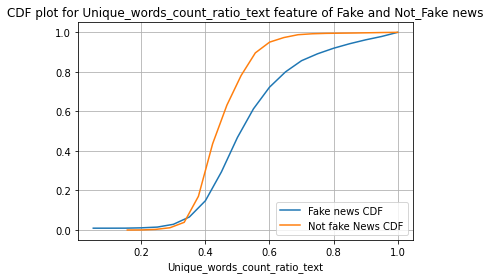

In [1654]:
#Fake news CDF plot
count ,bin_edges=np.histogram(Fake_adv["Unique_words_count_ratio_text"],bins=20,density=True)
pdf=count/(sum(count))
cdf=np.cumsum(pdf)
plt.plot(bin_edges[1:],cdf,label="Fake CDF")

#Not-Fake news CDF plot
count ,bin_edges=np.histogram(Not_Fake_adv["Unique_words_count_ratio_text"],bins=20,density=True)
pdf=count/(sum(count))
cdf=np.cumsum(pdf)
plt.plot(bin_edges[1:],cdf,label="Not fake CDF")

plt.xlabel("Unique_words_count_ratio_text")
plt.title("CDF plot for Unique_words_count_ratio_text feature of Fake and Not_Fake news")
plt.grid()
plt.legend(['Fake news CDF', 'Not fake News CDF'],loc='lower right');
plt.show()

> # Observation:-
1. Almost ~80%  Fake news artical text have less than  0.8 unique word count ratio 
2. Almost ~80%  not Fake news artical text have less than  0.6 unique word count ratio

> # Preprocessing the text data 

In [1655]:
def data_preprocess(text):
    '''This function will will preprocess the data by removing the puchuation digit email address and all non alphabet wrods from text.'''
    
    final_text=text.lower() 
    final_text=re.sub(r"[A-Za-z\d\-\.]+@[A-Za-z\.-]+\b", " ", final_text) #remove the email address from text
    final_text = re.sub(r'http\S+', '', final_text) # remove http links from text
    final_text=re.sub(r"\d+", " ", final_text) # remove any digit from text
    final_text=re.sub(r"[^a-zA-Z]+", " ", final_text) # remove anything except Alphabets from text
   
    #removing the punchuation
    punctuations = '!()-[]{};:"\,<>./?@#$%^&*_~'
    no_punc = " "
    for char in final_text:
        if char not in punctuations:
            no_punc = no_punc + char.lower()
        else:
            no_punc+=" "  #if punchuation found add space
    final_text=no_punc.strip()
    return final_text
        

In [1656]:
#https://github.com/dipanjanS/practical-machine-learning-with-python/blob/master/bonus%20content/nlp%20proven%20approach/contractions.py
#defining the dictionary containing all the apostrophe/short words used in english text
CONTRACTION_MAP = {
"ain’t": "is not",
"aren’t": "are not",
"can’t": "cannot",
"can’t’ve": "cannot have",
"’cause": "because",
"could’ve": "could have",
"couldn’t": "could not",
"couldn’t’ve": "could not have",
"didn’t": "did not",
"doesn’t": "does not",
"don’t": "do not",
"hadn’t": "had not",
"hadn’t’ve": "had not have",
"hasn’t": "has not",
"haven’t": "have not",
"he’d": "he would",
"he’d’ve": "he would have",
"he’ll": "he will",
"he’ll’ve": "he he will have",
"he’s": "he is",
"how’d": "how did",
"how’d’y": "how do you",
"how’ll": "how will",
"how’s": "how is",
"I’d": "I would",
"I’d’ve": "I would have",
"I’ll": "I will",
"I’ll’ve": "I will have",
"I’m": "I am",
"I’ve": "I have",
"i’d": "i would",
"i’d’ve": "i would have",
"i’ll": "i will",
"i’ll’ve": "i will have",
"i’m": "i am",
"i’ve": "i have",
"isn’t": "is not",
"it’d": "it would",
"it’d’ve": "it would have",
"it’ll": "it will",
"it’ll’ve": "it will have",
"it’s": "it is",
"let’s": "let us",
"ma’am": "madam",
"mayn’t": "may not",
"might’ve": "might have",
"mightn’t": "might not",
"mightn’t’ve": "might not have",
"must’ve": "must have",
"mustn’t": "must not",
"mustn’t’ve": "must not have",
"needn’t": "need not",
"needn’t’ve": "need not have",
"o’clock": "of the clock",
"oughtn’t": "ought not",
"oughtn’t’ve": "ought not have",
"shan’t": "shall not",
"sha’n’t": "shall not",
"shan’t’ve": "shall not have",
"she’d": "she would",
"she’d’ve": "she would have",
"she’ll": "she will",
"she’ll’ve": "she will have",
"she’s": "she is",
"should’ve": "should have",
"shouldn’t": "should not",
"shouldn’t’ve": "should not have",
"so’ve": "so have",
"so’s": "so as",
"that’d": "that would",
"that’d’ve": "that would have",
"that’s": "that is",
"there’d": "there would",
"there’d’ve": "there would have",
"there’s": "there is",
"they’d": "they would",
"they’d’ve": "they would have",
"they’ll": "they will",
"they’ll’ve": "they will have",
"they’re": "they are",
"they’ve": "they have",
"to’ve": "to have",
"wasn’t": "was not",
"we’d": "we would",
"we’d’ve": "we would have",
"we’ll": "we will",
"we’ll’ve": "we will have",
"we’re": "we are",
"we’ve": "we have",
"weren’t": "were not",
"what’ll": "what will",
"what’ll’ve": "what will have",
"what’re": "what are",
"what’s": "what is",
"what’ve": "what have",
"when’s": "when is",
"when’ve": "when have",
"where’d": "where did",
"where’s": "where is",
"where’ve": "where have",
"who’ll": "who will",
"who’ll’ve": "who will have",
"who’s": "who is",
"who’ve": "who have",
"why’s": "why is",
"why’ve": "why have",
"will’ve": "will have",
"won’t": "will not",
"won’t’ve": "will not have",
"would’ve": "would have",
"wouldn’t": "would not",
"wouldn’t’ve": "would not have",
"y’all": "you all",
"y’all’d": "you all would",
"y’all’d’ve": "you all would have",
"y’all’re": "you all are",
"y’all’ve": "you all have",
"you’d": "you would",
"you’d’ve": "you would have",
"you’ll": "you will",
"you’ll’ve": "you will have",
"you’re": "you are",
"you’ve": "you have"
}

In [1657]:
def decontracted(text):
    '''this function will Replace all apostrophe/short words from text data'''
    for word in text.split():
        if word.lower() in CONTRACTION_MAP:
            text = text.replace(word, CONTRACTION_MAP[word.lower()])
    return text

> # Calling decontracted functions for both train and test dataset title and text column

In [1658]:
%%time
df_train['cleaned_text'] = df_train.apply(lambda x: decontracted(x["text"]),axis=1)
df_train['cleaned_title'] = df_train.apply(lambda x: decontracted(x["title"]),axis=1)

df_test['cleaned_text'] = df_test.apply(lambda x: decontracted(x["text"]),axis=1)
df_test['cleaned_title'] = df_test.apply(lambda x: decontracted(x["title"]),axis=1)

Wall time: 7.47 s


In [1659]:
df_train.head(2)

,id,title,author,text,label,num_characters_title,num_characters_text,num_word_title,num_word_text,num_sentences_title,...,Avg_word_length_title,Avg_word_length_text,Avg_sentence_length_title,Avg_sentence_length_text,Stopword_count_ratio_title,Stopword_count_ratio_text,Unique_words_count_ratio_title,Unique_words_count_ratio_text,cleaned_text,cleaned_title
0,0,House Dem Aide: We Didn’t Even See Comey’s Let...,Darrell Lucus,House Dem Aide: We Didn’t Even See Comey’s Let...,1,81,4930,19,943,1,...,4.263158,5.227996,19.0,25.486486,0.105263,0.386002,0.947368,0.441145,House Dem Aide: We did not Even See Comey’s Le...,House Dem Aide: We did not Even See Comey’s Le...
1,1,"FLYNN: Hillary Clinton, Big Woman on Campus - ...",Daniel J. Flynn,Ever get the feeling your life circles the rou...,0,55,4160,11,822,1,...,5.000000,5.060827,11.0,28.344828,0.090909,0.371046,1.000000,0.486618,Ever get the feeling your life circles the rou...,"FLYNN: Hillary Clinton, Big Woman on Campus - ..."


> # Applying Preprocessing on train and test dataset

In [1660]:
%%time
df_train['cleaned_text'] = df_train.apply(lambda x: data_preprocess(x["cleaned_text"]),axis=1)
df_train['cleaned_title'] = df_train.apply(lambda x: data_preprocess(x["cleaned_title"]),axis=1)

df_test['cleaned_text'] = df_test.apply(lambda x: data_preprocess(x["cleaned_text"]),axis=1)
df_test['cleaned_title'] = df_test.apply(lambda x: data_preprocess(x["cleaned_title"]),axis=1)

Wall time: 48.3 s


In [1661]:
df_train.head(2)

,id,title,author,text,label,num_characters_title,num_characters_text,num_word_title,num_word_text,num_sentences_title,...,Avg_word_length_title,Avg_word_length_text,Avg_sentence_length_title,Avg_sentence_length_text,Stopword_count_ratio_title,Stopword_count_ratio_text,Unique_words_count_ratio_title,Unique_words_count_ratio_text,cleaned_text,cleaned_title
0,0,House Dem Aide: We Didn’t Even See Comey’s Let...,Darrell Lucus,House Dem Aide: We Didn’t Even See Comey’s Let...,1,81,4930,19,943,1,...,4.263158,5.227996,19.0,25.486486,0.105263,0.386002,0.947368,0.441145,house dem aide we did not even see comey s let...,house dem aide we did not even see comey s let...
1,1,"FLYNN: Hillary Clinton, Big Woman on Campus - ...",Daniel J. Flynn,Ever get the feeling your life circles the rou...,0,55,4160,11,822,1,...,5.000000,5.060827,11.0,28.344828,0.090909,0.371046,1.000000,0.486618,ever get the feeling your life circles the rou...,flynn hillary clinton big woman on campus brei...


> # Now extract and plot bar graph most 30 common words from fake articals text column

In [1662]:
from collections import Counter
count_n=Counter(" ".join(df_train[df_train["label"]==1]["text"]).split()).most_common(30)
Nuteraltemp = pd.DataFrame(count_n)
Nuteraltemp.columns = ['Common_words','count']

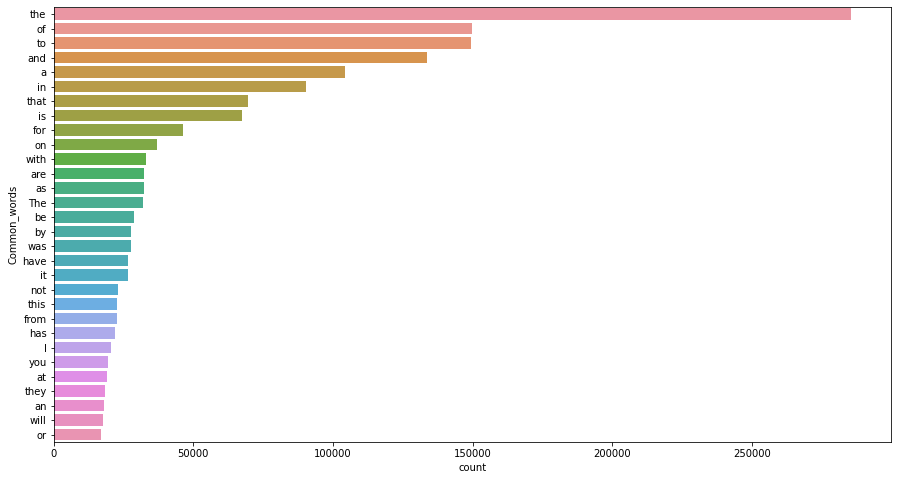

In [1663]:
fig,ax=plt.subplots(figsize=(15,8))
sns.barplot(x = 'count',
            y = 'Common_words',
            data = Nuteraltemp)
plt.show()

> # Removing the stop words from df_train dataset as in above plot there are mostly stopswords which are very common words in fake atricles

In [1664]:
def remove_stopwords(text):
    '''This function will remove stopwords from text data.'''
    stop_words = set(stopwords.words('english'))
    word_tokens = word_tokenize(text)
    
    filtered_sentence = " ".join([w for w in word_tokens if not w.lower() in stop_words])
    
    return filtered_sentence

In [1665]:
%%time
df_train["Without_Stopwords_text"]=df_train.apply(lambda x:remove_stopwords(x["cleaned_text"]),axis=1)

Wall time: 41.1 s


In [1666]:
%%time
df_test["Without_Stopwords_text"]=df_test.apply(lambda x:remove_stopwords(x["cleaned_text"]),axis=1)

Wall time: 11.6 s


In [1667]:
%%time
df_train["Without_Stopwords_title"]=df_train.apply(lambda x:remove_stopwords(x["cleaned_title"]),axis=1)

Wall time: 7.51 s


In [1668]:
%%time
df_test["Without_Stopwords_title"]=df_test.apply(lambda x:remove_stopwords(x["cleaned_title"]),axis=1)

Wall time: 2.31 s


In [1669]:
df_train.head(1)

,id,title,author,text,label,num_characters_title,num_characters_text,num_word_title,num_word_text,num_sentences_title,...,Avg_sentence_length_title,Avg_sentence_length_text,Stopword_count_ratio_title,Stopword_count_ratio_text,Unique_words_count_ratio_title,Unique_words_count_ratio_text,cleaned_text,cleaned_title,Without_Stopwords_text,Without_Stopwords_title
0,0,House Dem Aide: We Didn’t Even See Comey’s Let...,Darrell Lucus,House Dem Aide: We Didn’t Even See Comey’s Let...,1,81,4930,19,943,1,...,19.0,25.486486,0.105263,0.386002,0.947368,0.441145,house dem aide we did not even see comey s let...,house dem aide we did not even see comey s let...,house dem aide even see comey letter jason cha...,house dem aide even see comey letter jason cha...


In [1670]:
df_test.head(1)

,id,title,author,text,num_characters_title,num_characters_text,num_word_title,num_word_text,num_sentences_title,num_sentences_text,...,Avg_sentence_length_title,Avg_sentence_length_text,Stopword_count_ratio_title,Stopword_count_ratio_text,Unique_words_count_ratio_title,Unique_words_count_ratio_text,cleaned_text,cleaned_title,Without_Stopwords_text,Without_Stopwords_title
0,20800,"Specter of Trump Loosens Tongues, if Not Purse...",David Streitfeld,"PALO ALTO, Calif. — After years of scorning...",94,8015,19,1588,1,76,...,19.0,20.894737,0.157895,0.309194,0.947368,0.399874,palo alto calif after years of scorning the po...,specter of trump loosens tongues if not purse ...,palo alto calif years scorning political proce...,specter trump loosens tongues purse strings si...


> # Now again plotting most common 30 words in Fake news text column (excluding stop words) from train dataset

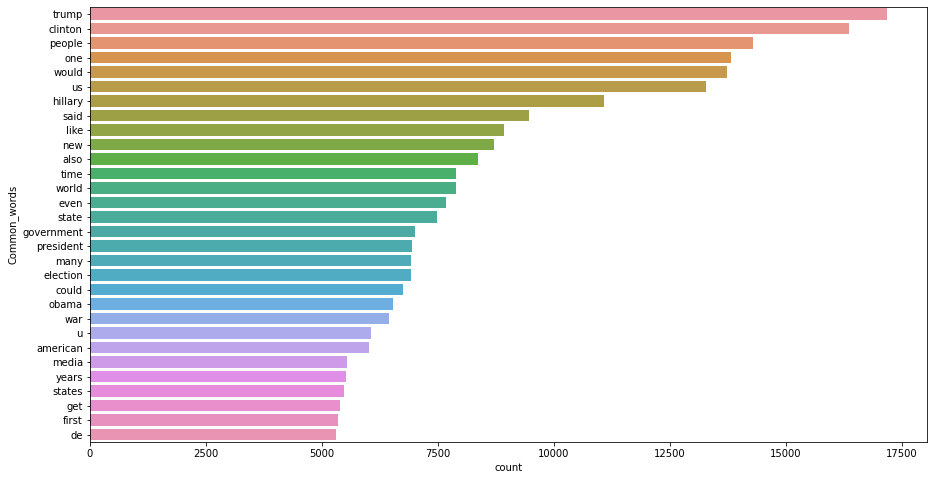

In [1671]:
from collections import Counter
count_n=Counter(" ".join(df_train[df_train["label"]==1]["Without_Stopwords_text"]).split()).most_common(30)
Nuteraltemp = pd.DataFrame(count_n)
Nuteraltemp.columns = ['Common_words','count']
fig,ax=plt.subplots(figsize=(15,8))
sns.barplot(x = 'count',
            y = 'Common_words',
            data = Nuteraltemp)
plt.show()

> # Observation:-
1. From above count plot we can see that in fake news most common 30 words are Trump Clinton Government American and media etc 

> # plotting most common 30 words in not Fake news text column

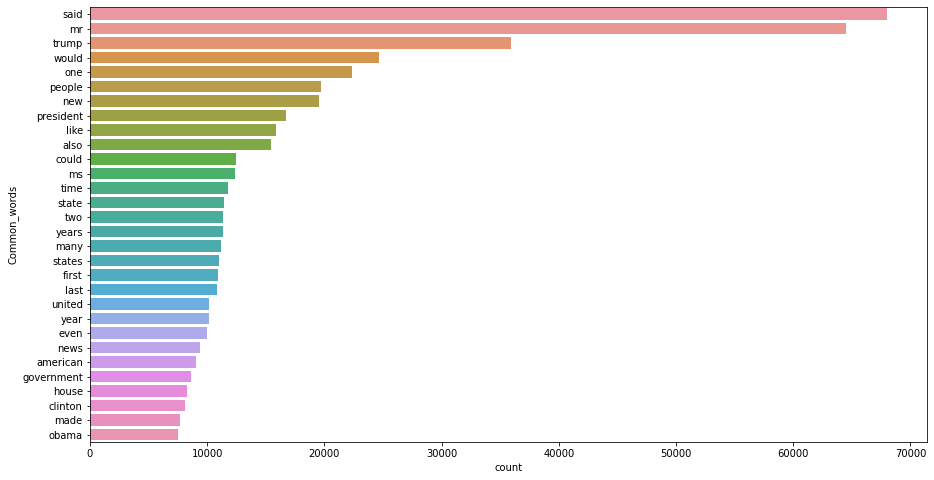

In [1672]:
count_n=Counter(" ".join(df_train[df_train["label"]==0]["Without_Stopwords_text"]).split()).most_common(30)
Nuteraltemp = pd.DataFrame(count_n)
Nuteraltemp.columns = ['Common_words','count']
fig,ax=plt.subplots(figsize=(15,8))
sns.barplot(x = 'count',
            y = 'Common_words',
            data = Nuteraltemp)
plt.show()

> # Observation:-
1. From above count plot we can see that in not fake news most common 30 words are Trump people etc 

> # ploting most 30 comman word from fake articles title column

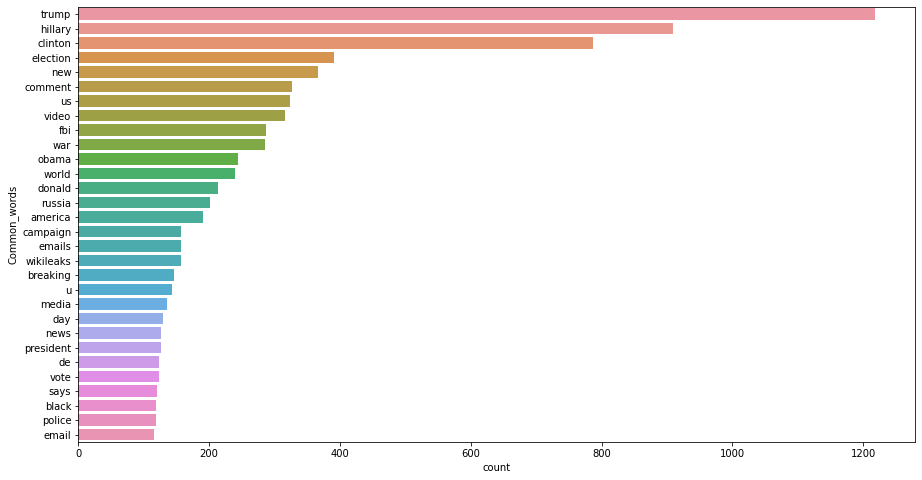

In [1673]:
count_n=Counter(" ".join(df_train[df_train["label"]==1]["Without_Stopwords_title"]).split()).most_common(30)
Nuteraltemp = pd.DataFrame(count_n)
Nuteraltemp.columns = ['Common_words','count']
fig,ax=plt.subplots(figsize=(15,8))
sns.barplot(x = 'count',
            y = 'Common_words',
            data = Nuteraltemp)
plt.show()

> # plotting most common 30 words in not Fake news title column

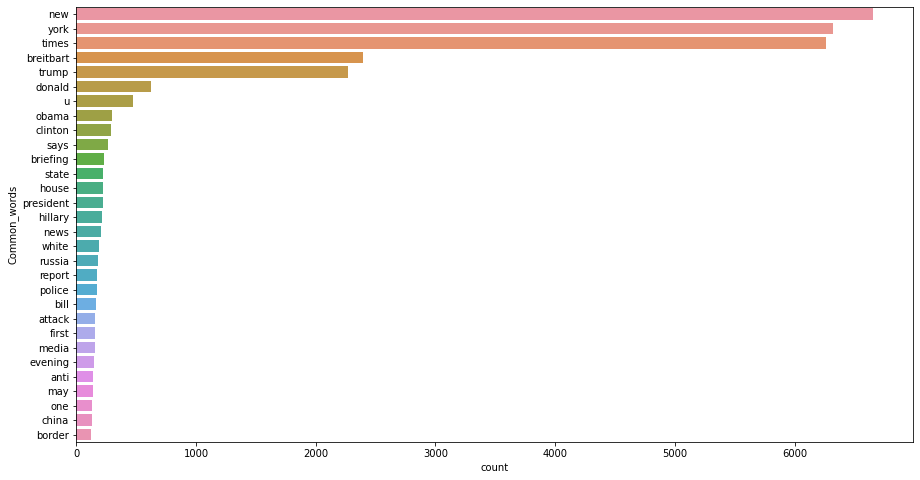

In [1674]:
count_n=Counter(" ".join(df_train[df_train["label"]==0]["Without_Stopwords_title"]).split()).most_common(30)
Nuteraltemp = pd.DataFrame(count_n)
Nuteraltemp.columns = ['Common_words','count']
fig,ax=plt.subplots(figsize=(15,8))
sns.barplot(x = 'count',
            y = 'Common_words',
            data = Nuteraltemp)
plt.show()

> # Plottng 30 most comman authors who publish fake articles

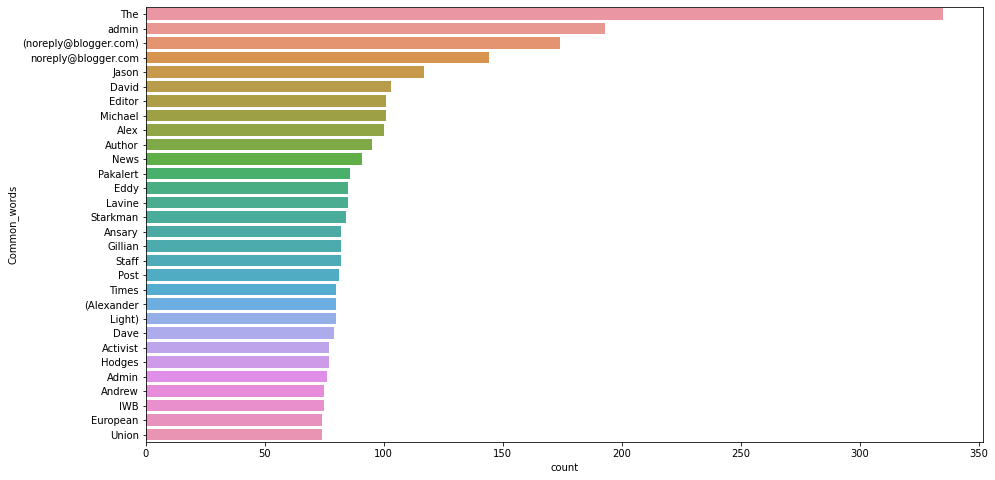

In [1675]:
count_n=Counter(" ".join(df_train[df_train["label"]==1]["author"]).split()).most_common(30)
Nuteraltemp = pd.DataFrame(count_n)
Nuteraltemp.columns = ['Common_words','count']
fig,ax=plt.subplots(figsize=(15,8))
sns.barplot(x = 'count',
            y = 'Common_words',
            data = Nuteraltemp)
plt.show()

> # Plottng 30 most comman authors who do not publish fake articles

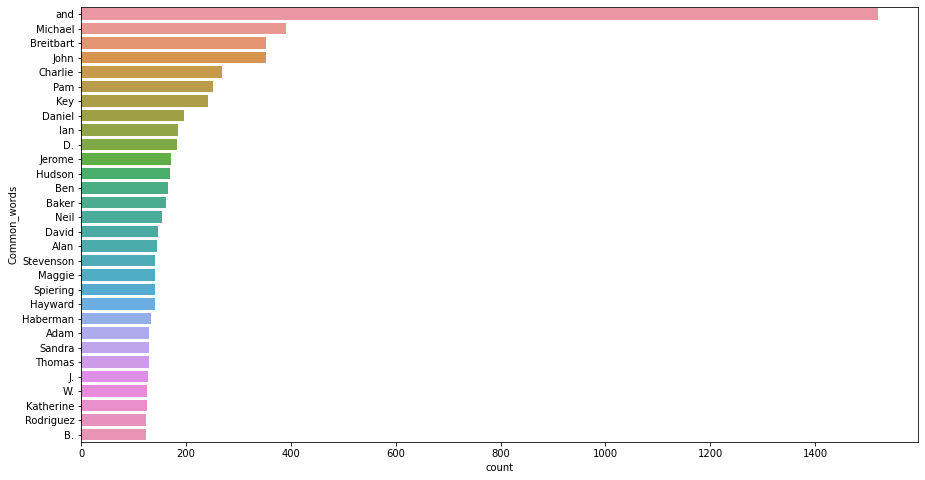

In [1676]:
count_n=Counter(" ".join(df_train[df_train["label"]==0]["author"]).split()).most_common(30)
Nuteraltemp = pd.DataFrame(count_n)
Nuteraltemp.columns = ['Common_words','count']
fig,ax=plt.subplots(figsize=(15,8))
sns.barplot(x = 'count',
            y = 'Common_words',
            data = Nuteraltemp)
plt.show()

 # Plotting word cloud on Train dataset for title,author and text column
 > # Word Cloud for Authors of Fake news articles on train dataset

In [1677]:
# creating dataset two dataset having only fake news data and other with Not fakes news data
df_train_fake=df_train[df_train["label"]==1]
df_train_not_fake=df_train[df_train["label"]==0]

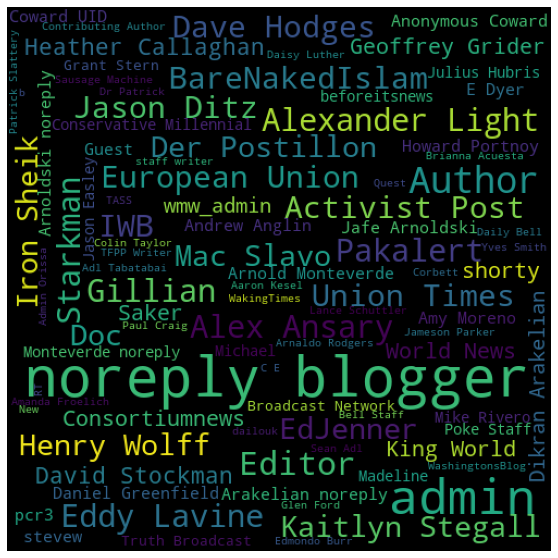

In [1678]:
from wordcloud import WordCloud
wc = WordCloud(width=500,height=500,min_font_size=10,background_color='black')
Fake_auth = wc.generate(df_train_fake["author"].str.cat(sep=" "))
plt.figure(figsize=(18,10))
plt.axis("off")
plt.imshow(Fake_auth)

> # Observation:-
1. Above word cloud shows that autho who almost everytime publish Fake new articles
2. Auther with bigger text have more number of datapoint where they published fake articles
like Eddy Lavine noreply blogger etc

> # Word Cloud for Authors of Not-Fake news articles on train dataset

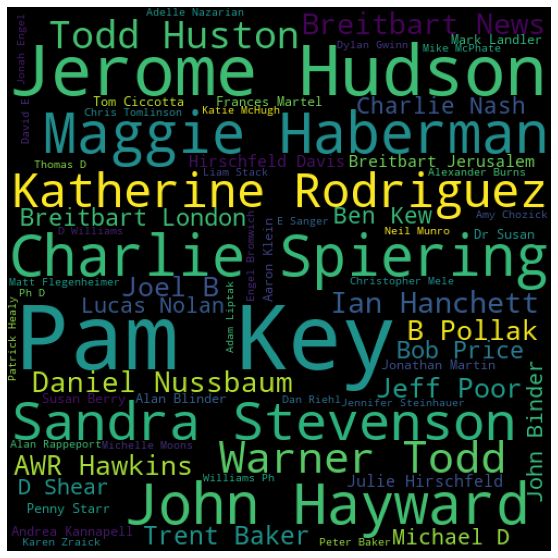

In [1679]:
Fake_auth = wc.generate(df_train_not_fake["author"].str.cat(sep=" "))
plt.figure(figsize=(18,10))
plt.axis("off")
plt.imshow(Fake_auth)

> # Observation:-
1. Above word cloud show that author who never publish Fake new articals
like john hayward Maggie Haberman etc

> # Word Cloud for text column for Fake news articles on train dataset

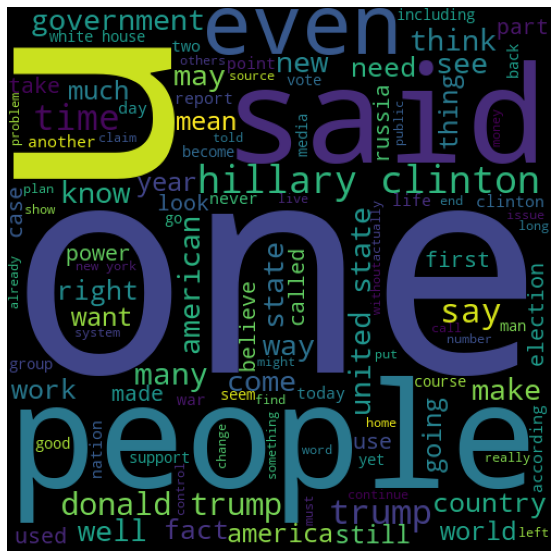

In [1680]:
Fake_text = wc.generate(df_train_fake["Without_Stopwords_text"].str.cat(sep=" "))
plt.figure(figsize=(18,10))
plt.axis("off")
plt.imshow(Fake_text)

> # Observation:-
1. Above word cloud shows most frequent words which apears on fake articals on text column like One ,people etc

> # Word Cloud for text of not Fake news articles on train dataset

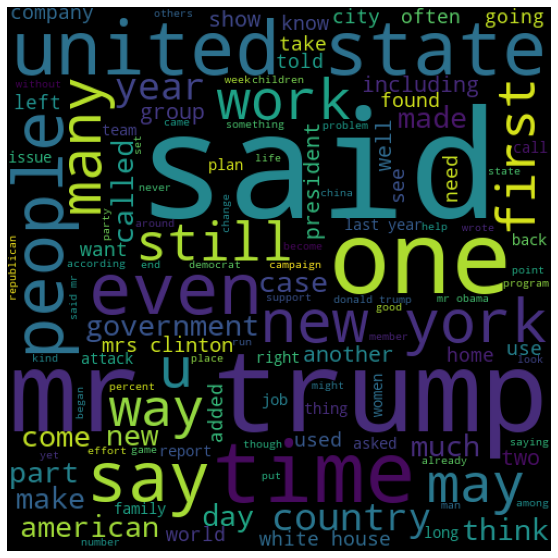

In [1681]:
not_fake_text = wc.generate(df_train_not_fake["Without_Stopwords_text"].str.cat(sep=" "))
plt.figure(figsize=(18,10))
plt.axis("off")
plt.imshow(not_fake_text)

> # Observation:-
1.  Above word cloud shows most frequent words which apears on not fake articals on text column like people may united state etc

> # Word Cloud of title for Fake news articles on train dataset

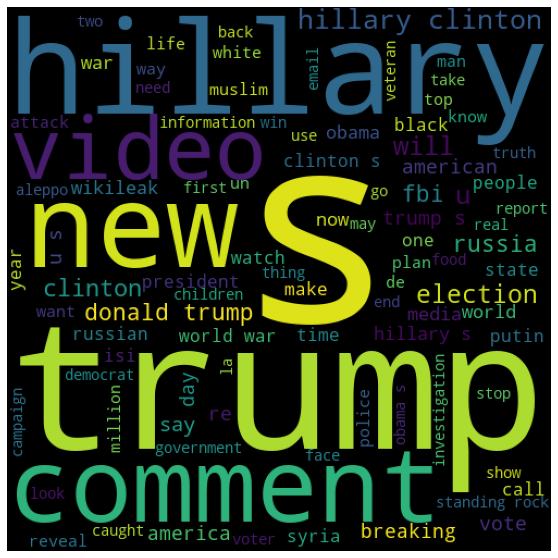

In [1682]:
Fake_ttitle = wc.generate(df_train_fake["cleaned_title"].str.cat(sep=" "))
plt.figure(figsize=(18,10))
plt.axis("off")
plt.imshow(Fake_ttitle)

> # Observation:-
1. Above word cloud shows most frequent words which apears on fake articals on tiltle column like fbi ,breaking etc

> # Word Cloud of title for Not Fake news articles on train dataset

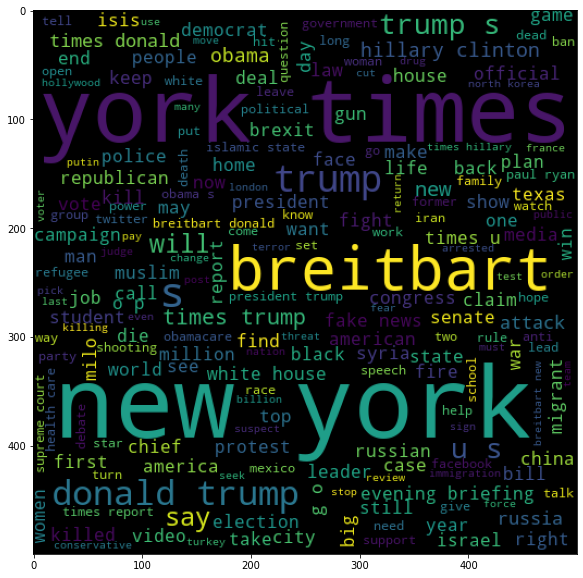

In [1683]:
not_fake_title = wc.generate(df_train_not_fake["cleaned_title"].str.cat(sep=" "))
plt.figure(figsize=(18,10))
plt.imshow(not_fake_title)

> # Observation:-
1. Above word cloud shows most frequent words which apears on not fake articals on tiltle column like new york times, trump ,End etc

 #  Plotting word cloud on Test dataset title,author and text column

> # Word cloud on Author column

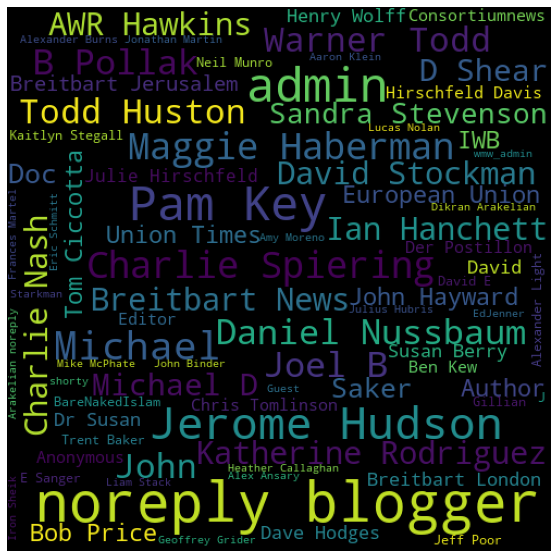

In [1684]:
# creating dataset two dataset having only fake news data and other with Not fakes news data
from wordcloud import WordCloud
wc = WordCloud(width=500,height=500,min_font_size=10,background_color='black')
test_auth = wc.generate(df_test["author"].str.cat(sep=" "))
#print ("Word Cloud for Authors of Fake news articles on train dataset")
plt.figure(figsize=(18,10))
plt.axis("off")
plt.imshow(test_auth)

> # Observation:-
1. from above word cloud we can see that we have similar author from train dataset who always publish fake artical  some example author  noreply blogger and admin present in both terain and testdataset
2.Also we have few author in test datset which is also presnent in the train dataset and  who alway publish artical which are not fake and they reliable news. e.g pam key and warner todd presnent in both train and test dataset.

> # Word cloud on title column

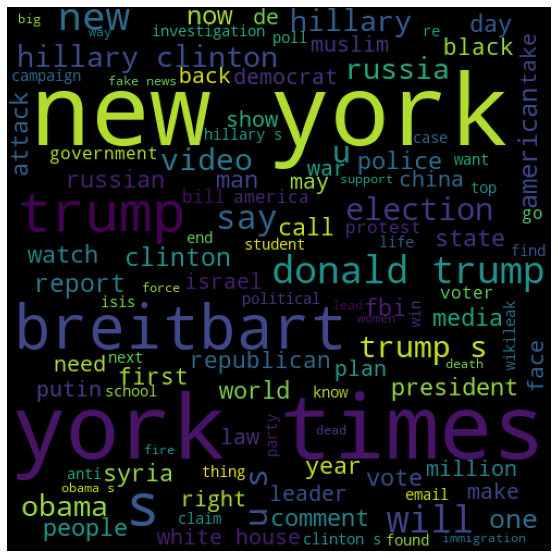

In [1685]:
test_title = wc.generate(df_test["cleaned_title"].str.cat(sep=" "))
plt.figure(figsize=(18,10))
plt.axis("off")
plt.imshow(test_title)

> # Word cloud on text column

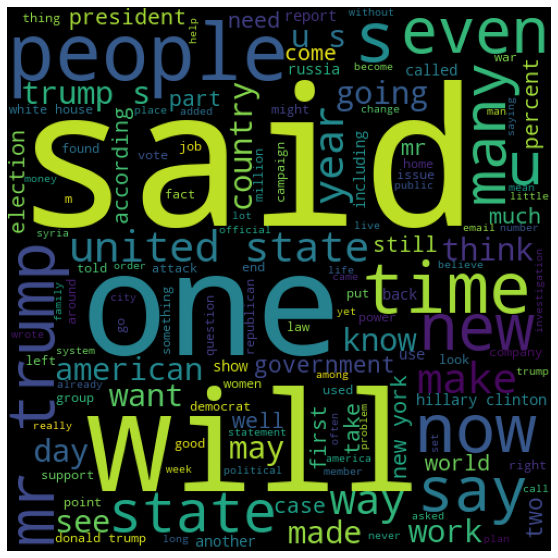

In [1686]:
test_text = wc.generate(df_test["cleaned_text"].str.cat(sep=" "))
plt.figure(figsize=(18,10))
plt.axis("off")
plt.imshow(test_text)

> # Bivariate analysis :-

> # Plotting the pair plot on above newly created features of train dataset

<Figure size 576x360 with 0 Axes>

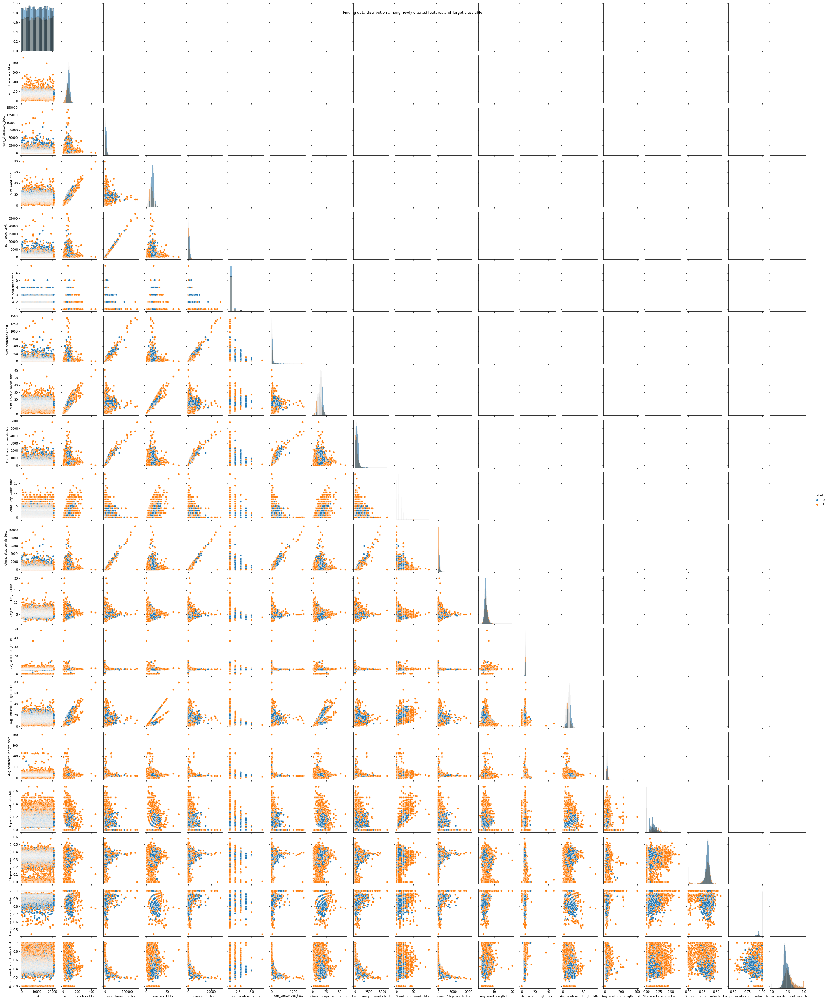

In [1687]:
plt.figure(figsize=(8,5))
g = sns.PairGrid(df_train, hue="label", aspect=0.8, diag_sharey=False)
g.map_lower(sns.scatterplot)
g.map_diag(sns.histplot)
g.add_legend()
plt.suptitle('Finding data distribution among newly created features and Target classlable')
plt.show()

> # Function to calculate Bigrams and trigrams and plot the bar plot for train dataset

In [1688]:
def generate_N_grams(texts,ngram=2):
    '''this function will calcualte most common bigrams and trigrams for text data and plot the bar plot'''
    common_bigrams=[]
    for text in tqdm(texts):
        words=[word for word in text.split(" ")]  
        temp=zip(*[words[i:] for i in range(0,ngram)])
        bigrams=[' '.join(ngram) for ngram in temp]
        common_bigrams.extend(bigrams)
    count_n=Counter(common_bigrams).most_common(30)
    Nuteraltemp = pd.DataFrame(count_n)
    Nuteraltemp.columns = ['Common_words','count'] 
    fig,ax=plt.subplots(figsize=(15,8))
    sns.barplot(x = 'count',
            y = 'Common_words',
            data = Nuteraltemp)
    plt.show()

> # Plotting bar plot of  most common bigram on fake news articles text(excluding stopwords) for train dataset

100%|████████████████████████████████████████████████████████████████████████████| 7924/7924 [00:01<00:00, 7522.35it/s]


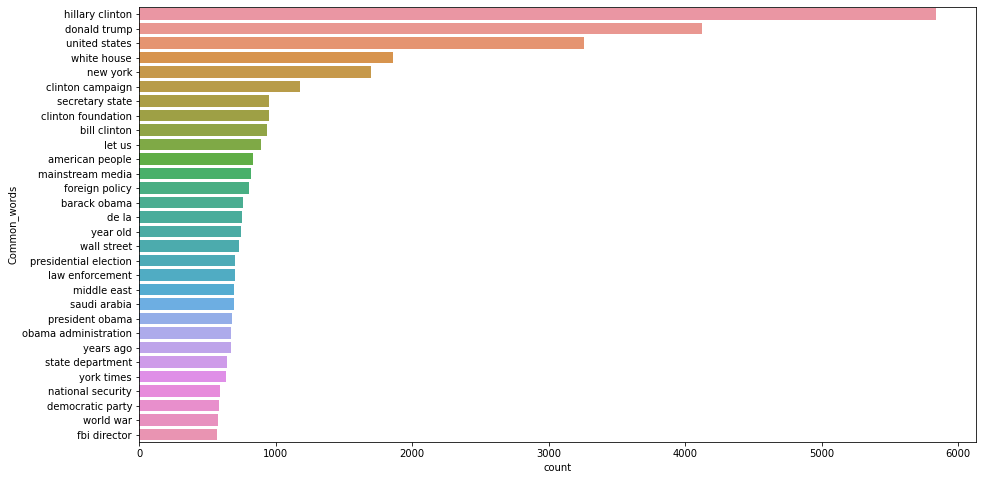

In [1689]:
generate_N_grams(df_train[df_train["label"]==1]["Without_Stopwords_text"].values,2)

# Observations:-
1. Most common 30 bigrams for fake news artical text are include hilary clinton ,donald trum and white house etc.

> # Plotting bar plot of  most common trigrams on fake news articles text(excluding stopwords) for train dataset

100%|████████████████████████████████████████████████████████████████████████████| 7924/7924 [00:01<00:00, 7258.03it/s]


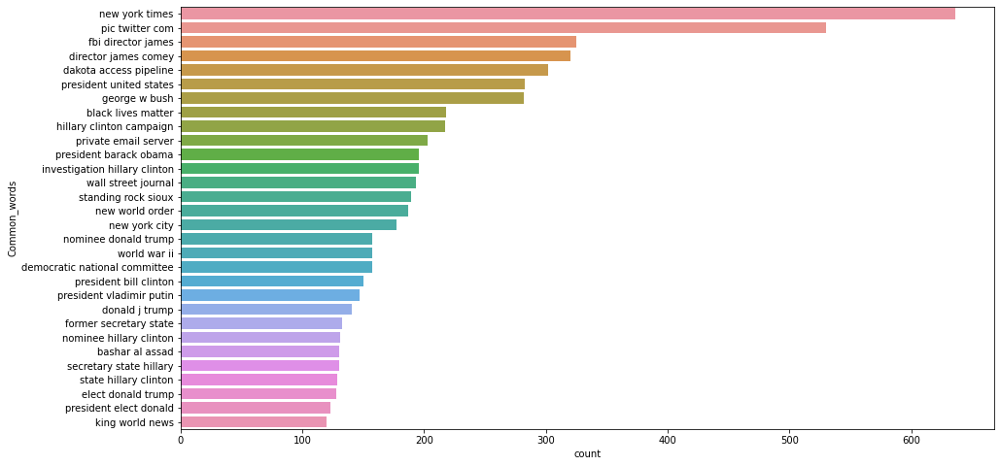

In [1690]:
generate_N_grams(df_train[df_train["label"]==1]["Without_Stopwords_text"].values,3)

# Observations:-
1. Most common 30 trigrams for fake news artical text are include new yor times,pic twitter com, fbi director james etc.

> # Plotting bar plot of  most common bigrams on not fake news articles text(excluding stopwords) for train dataset

100%|██████████████████████████████████████████████████████████████████████████| 10361/10361 [00:01<00:00, 5322.89it/s]


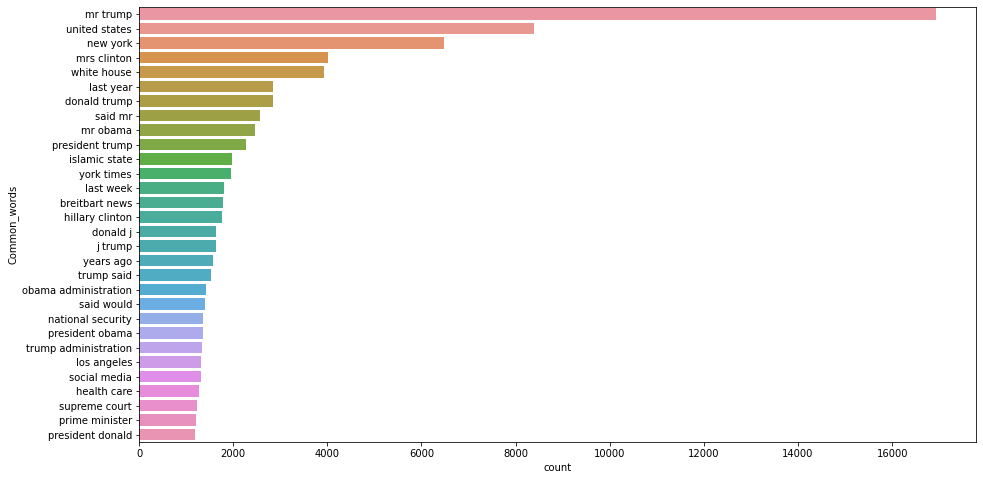

In [1691]:
generate_N_grams(df_train[df_train["label"]==0]["Without_Stopwords_text"].values,2)

# Observations:-
1. Most common 30 bigrams for not fake news artical text are includemr trump ,united states ,new york etc.

> # Plotting bar plot of  most common trigrams on not fake news articles text(excluding stopwords) for train dataset

100%|██████████████████████████████████████████████████████████████████████████| 10361/10361 [00:01<00:00, 5511.29it/s]


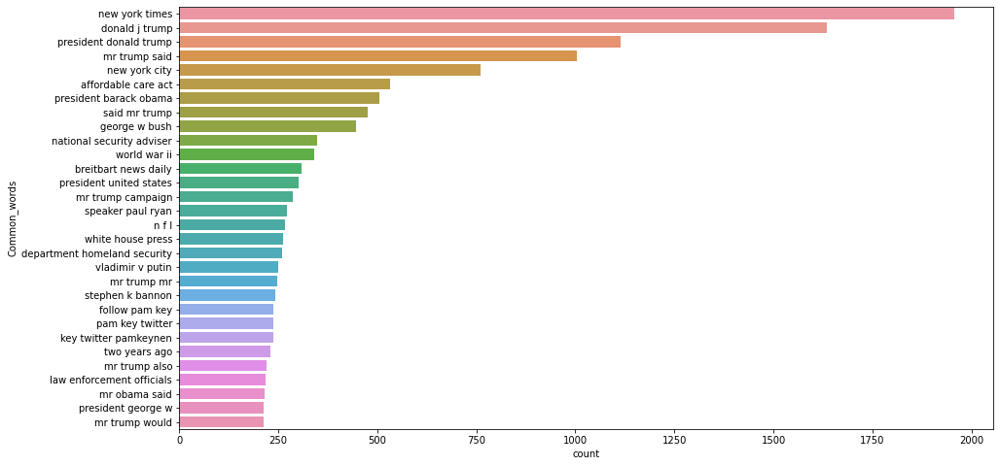

In [1692]:
generate_N_grams(df_train[df_train["label"]==0]["Without_Stopwords_text"].values,3)

# Observations:-
1. Most common 30 trigrams for not fake news artical text are include new yor times,donald j trump etc.

> # Applying the PCA on manually engineered 18 feautres on train dataset

In [1693]:
#creating deep copy for df_train dataset and creating new data frame name X_train_PCA
X_train_PCA=df_train.copy(deep=True) 

In [1694]:
X_train_PCA.head(2)

,id,title,author,text,label,num_characters_title,num_characters_text,num_word_title,num_word_text,num_sentences_title,...,Avg_sentence_length_title,Avg_sentence_length_text,Stopword_count_ratio_title,Stopword_count_ratio_text,Unique_words_count_ratio_title,Unique_words_count_ratio_text,cleaned_text,cleaned_title,Without_Stopwords_text,Without_Stopwords_title
0,0,House Dem Aide: We Didn’t Even See Comey’s Let...,Darrell Lucus,House Dem Aide: We Didn’t Even See Comey’s Let...,1,81,4930,19,943,1,...,19.0,25.486486,0.105263,0.386002,0.947368,0.441145,house dem aide we did not even see comey s let...,house dem aide we did not even see comey s let...,house dem aide even see comey letter jason cha...,house dem aide even see comey letter jason cha...
1,1,"FLYNN: Hillary Clinton, Big Woman on Campus - ...",Daniel J. Flynn,Ever get the feeling your life circles the rou...,0,55,4160,11,822,1,...,11.0,28.344828,0.090909,0.371046,1.000000,0.486618,ever get the feeling your life circles the rou...,flynn hillary clinton big woman on campus brei...,ever get feeling life circles roundabout rathe...,flynn hillary clinton big woman campus breitbart


In [1695]:
X_train_PCA.shape

(18285, 27)

In [1696]:
#dropping all the text column from dataframe
X_train_PCA.drop(["id","title","text","label","cleaned_text","cleaned_title","Without_Stopwords_text","Without_Stopwords_title","author"],axis=1,inplace=True)

In [1697]:
X_train_PCA.shape

(18285, 18)

In [1698]:
X_train_PCA.head(2)

,num_characters_title,num_characters_text,num_word_title,num_word_text,num_sentences_title,num_sentences_text,Count_unique_words_title,Count_unique_words_text,Count_Stop_words_title,Count_Stop_words_text,Avg_word_length_title,Avg_word_length_text,Avg_sentence_length_title,Avg_sentence_length_text,Stopword_count_ratio_title,Stopword_count_ratio_text,Unique_words_count_ratio_title,Unique_words_count_ratio_text
0,81,4930,19,943,1,37,18,416,2,364,4.263158,5.227996,19.0,25.486486,0.105263,0.386002,0.947368,0.441145
1,55,4160,11,822,1,29,11,400,1,305,5.000000,5.060827,11.0,28.344828,0.090909,0.371046,1.000000,0.486618


In [1699]:
df_train.head(2)

,id,title,author,text,label,num_characters_title,num_characters_text,num_word_title,num_word_text,num_sentences_title,...,Avg_sentence_length_title,Avg_sentence_length_text,Stopword_count_ratio_title,Stopword_count_ratio_text,Unique_words_count_ratio_title,Unique_words_count_ratio_text,cleaned_text,cleaned_title,Without_Stopwords_text,Without_Stopwords_title
0,0,House Dem Aide: We Didn’t Even See Comey’s Let...,Darrell Lucus,House Dem Aide: We Didn’t Even See Comey’s Let...,1,81,4930,19,943,1,...,19.0,25.486486,0.105263,0.386002,0.947368,0.441145,house dem aide we did not even see comey s let...,house dem aide we did not even see comey s let...,house dem aide even see comey letter jason cha...,house dem aide even see comey letter jason cha...
1,1,"FLYNN: Hillary Clinton, Big Woman on Campus - ...",Daniel J. Flynn,Ever get the feeling your life circles the rou...,0,55,4160,11,822,1,...,11.0,28.344828,0.090909,0.371046,1.000000,0.486618,ever get the feeling your life circles the rou...,flynn hillary clinton big woman on campus brei...,ever get feeling life circles roundabout rathe...,flynn hillary clinton big woman campus breitbart


# Applying the standard scaler to mean centered all our numerical fearures

In [1700]:
from sklearn.preprocessing  import StandardScaler
sc=StandardScaler()
X_train_std=sc.fit_transform(X_train_PCA)

In [1701]:
X_train_PCA.shape

(18285, 18)

# Applying the pca on top of our 18 numberical feaures and getting top 2 PCA compoenents from transformed spaces

In [1702]:
from sklearn.decomposition import PCA
pca=PCA(n_components=2)#taking 2 princile compoents out of 18 original manually engineered feature
X_train_trf = pca.fit_transform(X_train_std)

In [1703]:
# getting the class lable in y_train
y_train=df_train["label"]

# now plotting the our top 2 PCA components feauture in 2D scatter plot to see if we are able seperate both calsses with our transformed Principle component which we got by using our 18 numericals features

In [1704]:
import plotly.express as px
import plotly.offline as pyo
import plotly.graph_objs as go
# Set notebook mode to work in offline
pyo.init_notebook_mode()
y_train_trf = y_train.astype(str)
fig = px.scatter(x=X_train_trf[:,0],
                 y=X_train_trf[:,1],
                 color=y_train_trf,
                 color_discrete_sequence=px.colors.qualitative.G10,
                title="2D Scatter plot on top 2 Principle Component features")           
fig.show()

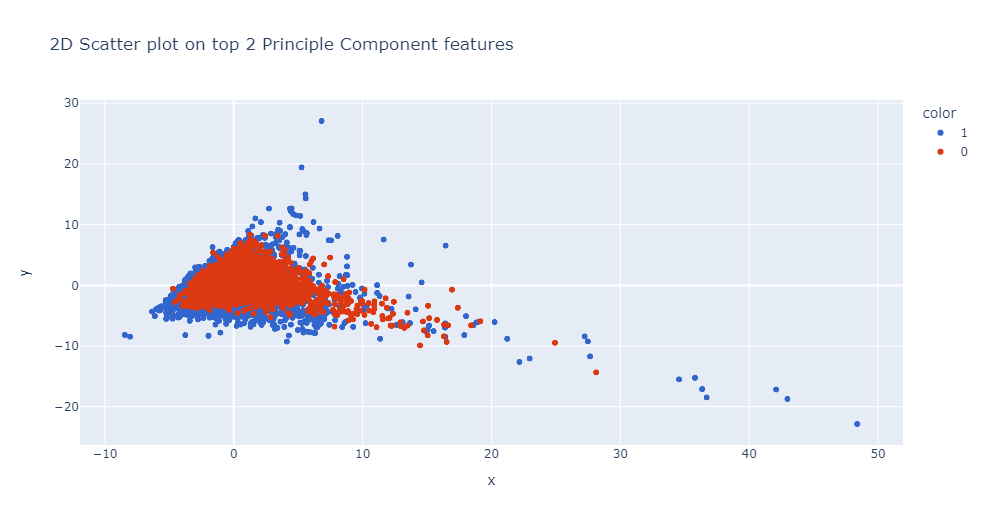

# Observations:-
1. From above plot we are able to seperate our both classess and that shows our manaully engineered feature are usefull for seperating both classess to some extend

# Creating a baseline model using Naive Bayes Algorithms using our 18 manually created features and text featurization on text an title columns 

# Extracting X and Y datapoints from df_train DataFrame

In [1705]:
Y=df_train["label"]
X=df_train.drop(["id","title","text","label","cleaned_text","cleaned_title","author"], axis=1, inplace=False)


In [1706]:
X.shape,Y.shape

((18285, 20), (18285,))

In [1707]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.25, stratify=Y,random_state=42)

In [1708]:
print(X_train.shape, y_train.shape)
print(X_test.shape, y_test.shape)

(13713, 20) (13713,)
(4572, 20) (4572,)


In [1709]:
X_train.head()

,num_characters_title,num_characters_text,num_word_title,num_word_text,num_sentences_title,num_sentences_text,Count_unique_words_title,Count_unique_words_text,Count_Stop_words_title,Count_Stop_words_text,Avg_word_length_title,Avg_word_length_text,Avg_sentence_length_title,Avg_sentence_length_text,Stopword_count_ratio_title,Stopword_count_ratio_text,Unique_words_count_ratio_title,Unique_words_count_ratio_text,Without_Stopwords_text,Without_Stopwords_title
8682,69,287,10,42,1,2,10,36,3,12,6.900000,6.833333,10.0,21.000000,0.300000,0.285714,1.0,0.857143,next swipe left right important question scunt...,important question scunthorpe hospital compute...
13800,82,4203,19,807,1,22,19,351,1,266,4.315789,5.208178,19.0,36.681818,0.052632,0.329616,1.0,0.434944,videos julian assange trump allowed win clinto...,julian assange trump allowed win clinton isis ...
977,80,4159,13,806,1,32,13,384,2,285,6.153846,5.160050,13.0,25.187500,0.153846,0.353598,1.0,0.476427,jared kushner wife ivanka trump enlisted servi...,weiner rising white house ally disgraced ex co...
17009,86,7537,16,1509,1,59,16,560,2,538,5.375000,4.994698,16.0,25.576271,0.125000,0.356528,1.0,0.371107,new delhi year ashish kumar mandal scratched l...,india hobbles cash crisis electronic payments ...
9698,60,1688,11,290,1,11,11,183,0,5,5.454545,5.820690,11.0,26.363636,0.000000,0.017241,1.0,0.631034,sonntag november arbeitsministerium f hrt rent...,arbeitsministerium f hrt rente zw lf jahre vor...


# Featurizing our text column data using count vectorizer with max feature as 3000

In [1710]:
from sklearn.feature_extraction.text import TfidfVectorizer
vectorizer =CountVectorizer(ngram_range=(1,2),max_features=3000)
vectorizer.fit(X_train["Without_Stopwords_title"].values)

# we use the fitted CountVectorizer to convert the text to vector
X_train_title = vectorizer.transform(X_train['Without_Stopwords_title']).toarray()
X_test_title = vectorizer.transform(X_test['Without_Stopwords_title']).toarray()

print("After vectorizations shape of train and test data")
print(X_train_title.shape, y_train.shape)
print(X_test_title.shape, y_test.shape)
print("="*100)

After vectorizations shape of train and test data
(13713, 3000) (13713,)
(4572, 3000) (4572,)


# Featurizing our title column data using count vectorizer with max feature as 3000

In [1711]:
%%time
vectorizer_text =CountVectorizer(ngram_range=(1,2),max_features=3000)
vectorizer_text.fit(X_train["Without_Stopwords_text"].values)

# we use the fitted CountVectorizer to convert the text to vector
X_train_text = vectorizer.transform(X_train['Without_Stopwords_text'].values).toarray()
X_test_text = vectorizer.transform(X_test['Without_Stopwords_text'].values).toarray()

print("After vectorizations shape of train and test data")
print(X_train_text.shape, y_train.shape)
print(X_test_text.shape, y_test.shape)
print("="*100)

After vectorizations shape of train and test data
(13713, 3000) (13713,)
(4572, 3000) (4572,)
Wall time: 35.2 s


In [1712]:
X_train.drop(["Without_Stopwords_text","Without_Stopwords_title"],axis=1,inplace=True)

In [1713]:
X_train.head()

,num_characters_title,num_characters_text,num_word_title,num_word_text,num_sentences_title,num_sentences_text,Count_unique_words_title,Count_unique_words_text,Count_Stop_words_title,Count_Stop_words_text,Avg_word_length_title,Avg_word_length_text,Avg_sentence_length_title,Avg_sentence_length_text,Stopword_count_ratio_title,Stopword_count_ratio_text,Unique_words_count_ratio_title,Unique_words_count_ratio_text
8682,69,287,10,42,1,2,10,36,3,12,6.900000,6.833333,10.0,21.000000,0.300000,0.285714,1.0,0.857143
13800,82,4203,19,807,1,22,19,351,1,266,4.315789,5.208178,19.0,36.681818,0.052632,0.329616,1.0,0.434944
977,80,4159,13,806,1,32,13,384,2,285,6.153846,5.160050,13.0,25.187500,0.153846,0.353598,1.0,0.476427
17009,86,7537,16,1509,1,59,16,560,2,538,5.375000,4.994698,16.0,25.576271,0.125000,0.356528,1.0,0.371107
9698,60,1688,11,290,1,11,11,183,0,5,5.454545,5.820690,11.0,26.363636,0.000000,0.017241,1.0,0.631034


In [1714]:
X_test.drop(["Without_Stopwords_text","Without_Stopwords_title"],axis=1,inplace=True)

In [1715]:
X_test.shape,X_train.shape

((4572, 18), (13713, 18))

# Applying Standardization on  manually engineered numericals  features

In [1716]:
sc=StandardScaler()
X_train_Num_Std=sc.fit_transform(X_train)
X_test_Num_Std=sc.transform(X_test)

In [1717]:
# Plot the training and the CV AUC scores, for different values of 'alpha', using a 2D line plot
X_train_final = np.hstack((X_train_title, X_train_text,X_train_Num_Std))
X_test_final = np.hstack((X_test_title , X_test_text,X_test_Num_Std))

print("Final Data matrix")
print(X_train_final.shape, y_train.shape)
print(X_test_final.shape, y_test.shape)
print("="*100)

Final Data matrix
(13713, 6018) (13713,)
(4572, 6018) (4572,)


# Fitting baseline model Gaussian Naive bayes on Count vectorized features and manually engineered features

In [1718]:
gnb = GaussianNB()
gnb.fit(X_train_final,y_train)
y_pred = gnb.predict(X_test_final)
accuracy = accuracy_score(y_test,y_pred)
precision = precision_score(y_test,y_pred)
print("accuracy :",accuracy)
print("precision :",precision)

accuracy : 0.8661417322834646
precision : 0.8224211022138483


> # Final Observation:-
1. In total i have created 18 Features manually from the title and text column of this dataset,
    Manually engnieered Features list:-
    1.  Count_unique_words_title
    2.  Count_unique_words_text
    3.  Count_Stop_words_title
    4.  Count_Stop_words_text
    5.  Avg_word_length_title
    6.  Avg_word_length_text
    7.  Avg_sentence_length_title
    8.  Avg_sentence_length_text
    9.  Stopword_count_ratio_title
    10. Stopword_count_ratio_text
    11. Unique_words_count_ratio_title
    12. Unique_words_count_ratio_text
    13. Number of characters in title
    14. Number of characters in text
    15. Number of words in title
    16. Number of words in text
    17. Number of Sentences in title
    18. Number of Sentences in text
2.  I have applied PCA(pricinple component Anaylsis Alogrightm on above 18 manually engineered features.
    and created two new Featers based on top two Principal components and plot the 2D scatter plot and after anayzing the plot we can say that above manually engineered feature are able to seperate both clasess to some extend.
8. Along with 18 features i have applied count vectorization on top of Text feature(without stop words) and title feature (without stopwords) and created in total 6018 feature (3000 from text vectorization 3000 feature from title feature text vectorization and 18 above mentioned featured)
3.  Created baseline mode Gaussian Naive baye with above 6018 feature and X_train and after fitting the train dataset in GB naive bayes when we tested our accuracy on test data we have 86% accuracy score on testdataset which is decent for baseline mode.
4. For model building we will not be using Author column as one of the feature as some time its difficult to find the author name for any article also there can be case if that for any article author name is fake hence we drop author name column before model bulding.